In [1]:
# Cell 1: Import required libraries
import base64
from io import BytesIO
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import zipfile
import json
import pandas as pd
import os
import seaborn as sns

In [2]:
# Cell 2: Data extraction functions
def extract_valid_results(jrzip_path):
    """Extract and validate results from JRZIP file"""
    def load_single_result(json_line):
        try:
            data = json.loads(json_line)
            # Check if this is a valid entry with required fields
            if (isinstance(data, dict) and 
                'metadata' in data and 
                'participant_id' in data['metadata']):
                return data
        except json.JSONDecodeError:
            return None
        return None

    valid_results = []
    with zipfile.ZipFile(jrzip_path, 'r') as zip_ref:
        for file_name in zip_ref.namelist():
            if file_name.endswith('.txt'):
                with zip_ref.open(file_name) as f:
                    content = f.read().decode('utf-8')
                    for line in content.split('\n'):
                        if line.strip():
                            result = load_single_result(line)
                            if result:
                                valid_results.append(result)
    
    print(f"Found {len(valid_results)} valid results")
    return valid_results

In [3]:
# Cell 3: DataFrame creation functions
def create_participant_df(valid_results):
    """Create participant info DataFrame"""
    participant_info = []
    for result in valid_results:
        info = {
            'participant_id': result['metadata']['participant_id'],
            'timestamp': result['metadata']['timestamp'],
            'filter_threshold': result['metadata']['parameters']['filter_parameters']['threshold'],
            'preservation_factor': result['metadata']['parameters']['filter_parameters']['preservation_factor'],
            'noise_reduction': result['metadata']['parameters']['filter_parameters']['noise_reduction_factor']
        }
        participant_info.append(info)
    return pd.DataFrame(participant_info).set_index('participant_id')

def create_training_df(valid_results):
    """Create training phase DataFrame"""
    training_data = []
    for result in valid_results:
        if isinstance(result.get('training_phase'), dict):
            training = {
                'participant_id': result['metadata']['participant_id'],
                'total_trials': result['training_phase']['summary']['total_trials'],
                'correct_trials': result['training_phase']['summary']['correct_trials'],
                'accuracy': result['training_phase']['summary']['accuracy_percentage'],
                'mean_rt': result['training_phase']['summary']['mean_rt']
            }
            training_data.append(training)
    return pd.DataFrame(training_data).set_index('participant_id')

def create_vviq_df(valid_results):
    """Create VVIQ DataFrame with attention check validation"""
    vviq_data = []
    for result in valid_results:
        participant_id = result['metadata']['participant_id']
        vviq_metadata = result['metadata'].get('vviq_data', {})
        
        # Check attention checks
        attention_checks = vviq_metadata.get('attention_check_passed', {})
        
        for eye_condition in ['eyes_open', 'eyes_closed']:
            responses = vviq_metadata.get(eye_condition, [])
            for response in responses:
                for item, rating in response.get('responses', {}).items():
                    vviq_data.append({
                        'participant_id': participant_id,
                        'condition': eye_condition,
                        'question_index': response.get('question_index'),
                        'item': item,
                        'rating': rating,
                        'attention_check_passed': attention_checks.get(eye_condition, False)
                    })
    return pd.DataFrame(vviq_data)

def create_caps_df(valid_results):
    """Create CAPS DataFrame"""
    caps_data = []
    for result in valid_results:
        participant_id = result['metadata']['participant_id']
        caps_responses = result['metadata'].get('caps_data', [])
        
        for response in caps_responses:
            caps_data.append({
                'participant_id': participant_id,
                'question_index': response.get('question_index'),
                'question_text': response.get('question_text'),
                'response': response.get('response'),
                'subscale': response.get('subscale')
            })
    return pd.DataFrame(caps_data)

def create_evolution_df(valid_results):
    """Create evolution DataFrame"""
    evolution_data = []
    for result in valid_results:
        participant_id = result['metadata']['participant_id']
        for entry in result['evolution_summary']:
            evolution_data.append({
                'participant_id': participant_id,
                'session': entry['session'],
                'generation': entry['generation'],
                'n_selections': len(entry['selected_parents'])
            })
    return pd.DataFrame(evolution_data)

In [4]:
# Cell 4: Analysis functions
def analyze_attention_checks(vviq_df):
    """Analyze VVIQ attention check performance"""
    attention_summary = vviq_df.groupby('participant_id')['attention_check_passed'].agg(['first', 'count'])
    attention_summary.columns = ['passed_check', 'total_responses']
    return attention_summary

def analyze_training_performance(training_df):
    """Analyze training phase performance"""
    performance_summary = training_df.agg({
        'accuracy': ['mean', 'std', 'min', 'max'],
        'mean_rt': ['mean', 'std']
    }).round(2)
    return performance_summary

In [5]:
# Cell 5: Usage example
#jrzip_path = "jatos_results_20241209_filtered_post5074.jrzip" #this one is without me and guido
#jrzip_path = "jatos_results_20241211_latest.jrzip"
#jrzip_path = "jatos_results_20241209150149.jrzip" #this one is with  me and guido
#jrzip_path = "jatos_results_20241212_withMiguelito.jrzip" #this is all valid with muguelito as -1, i.e. non SONA participant
jrzip_path = "jatos_results_20250207155153.jrzip" #Final valid SONA batch
valid_results = extract_valid_results(jrzip_path)

# Create all DataFrames
dfs = {
    'participants': create_participant_df(valid_results),
    'training': create_training_df(valid_results),
    'vviq': create_vviq_df(valid_results),
    'caps': create_caps_df(valid_results),
    'evolution': create_evolution_df(valid_results)
}

# Print basic info about each DataFrame
for name, df in dfs.items():
    print(f"\n{name} DataFrame shape:", df.shape)
    print(f"Columns:", df.columns.tolist())

# Analyze attention checks and training performance
attention_summary = analyze_attention_checks(dfs['vviq'])
training_summary = analyze_training_performance(dfs['training'])

print("\nVVIQ Attention Check Summary:")
print(attention_summary)
print("\nTraining Performance Summary:")
print(training_summary)

Found 85 valid results

participants DataFrame shape: (85, 4)
Columns: ['timestamp', 'filter_threshold', 'preservation_factor', 'noise_reduction']

training DataFrame shape: (82, 4)
Columns: ['total_trials', 'correct_trials', 'accuracy', 'mean_rt']

vviq DataFrame shape: (2890, 6)
Columns: ['participant_id', 'condition', 'question_index', 'item', 'rating', 'attention_check_passed']

caps DataFrame shape: (2720, 5)
Columns: ['participant_id', 'question_index', 'question_text', 'response', 'subscale']

evolution DataFrame shape: (1190, 4)
Columns: ['participant_id', 'session', 'generation', 'n_selections']

VVIQ Attention Check Summary:
                passed_check  total_responses
participant_id                               
-1                      True               34
11893                  False               34
11911                   True               68
11914                   True               34
11929                   True               34
...                      ...       

In [6]:
# Cell 1: Improved attention check identification
def identify_failed_attention_checks(dfs):
    vviq_df = dfs['vviq']
    
    # Group by participant and ensure ALL attention checks are passed
    attention_status = vviq_df.groupby('participant_id')['attention_check_passed'].agg(
        lambda x: all(x)  # Must pass ALL attention checks
    )
    
    # Get participants who failed any attention check
    failed_participants = attention_status[~attention_status].index.tolist()
    
    print("\nAttention check status per participant:")
    print(attention_status)
    print(f"\nFound {len(failed_participants)} participants who failed at least one attention check")
    print("Failed Participant IDs:", failed_participants)
    
    return failed_participants

# Cell 2: Separate naughty participants
def separate_naughty_participants(dfs, failed_participants):
    naughty_dfs = {}
    clean_dfs = {}
    
    for name, df in dfs.items():
        if df.index.name == 'participant_id':
            # For DataFrames indexed by participant_id
            naughty_dfs[name] = df.loc[df.index.isin(failed_participants)]
            clean_dfs[name] = df.loc[~df.index.isin(failed_participants)]
        else:
            # For DataFrames with participant_id as a column
            naughty_dfs[name] = df[df['participant_id'].isin(failed_participants)]
            clean_dfs[name] = df[~df['participant_id'].isin(failed_participants)]
    
    # Print summary of removed participants
    print("\nParticipants removed from analysis:")
    for participant in failed_participants:
        print(f"\nParticipant {participant}:")
        for name, df in naughty_dfs.items():
            if df.index.name == 'participant_id' and participant in df.index:
                print(f"- Found in {name} DataFrame")
    
    return clean_dfs, naughty_dfs

# Cell 3: Usage
failed_participants = identify_failed_attention_checks(dfs)
clean_dfs, naughty_dfs = separate_naughty_participants(dfs, failed_participants)

# Cell 4: Verification
print("\nVerification of clean DataFrames:")
for name, df in clean_dfs.items():
    if df.index.name == 'participant_id':
        print(f"\n{name} remaining participants:", len(df))
    else:
        print(f"\n{name} remaining entries:", len(df))



Attention check status per participant:
participant_id
-1        True
11893    False
11911     True
11914     True
11929     True
         ...  
15052     True
15169     True
4702     False
4737      True
4739      True
Name: attention_check_passed, Length: 76, dtype: bool

Found 7 participants who failed at least one attention check
Failed Participant IDs: ['11893', '12049', '12136', '12235', '13471', '14269', '4702']

Participants removed from analysis:

Participant 11893:
- Found in participants DataFrame
- Found in training DataFrame

Participant 12049:
- Found in participants DataFrame
- Found in training DataFrame

Participant 12136:
- Found in participants DataFrame
- Found in training DataFrame

Participant 12235:
- Found in participants DataFrame
- Found in training DataFrame

Participant 13471:
- Found in participants DataFrame
- Found in training DataFrame

Participant 14269:
- Found in participants DataFrame
- Found in training DataFrame

Participant 4702:
- Found in parti

In [7]:
clean_dfs

{'participants':                                timestamp  filter_threshold  \
 participant_id                                               
 4737            2024-12-02T10:22:55.867Z                30   
 4739            2024-12-02T13:31:29.290Z                30   
 15169           2024-12-06T11:26:12.514Z                30   
 12109           2024-12-07T16:31:10.113Z                30   
 11974           2024-12-07T16:17:23.921Z                30   
 ...                                  ...               ...   
 13666           2025-01-09T22:48:19.153Z                30   
 13246           2025-01-10T00:43:12.564Z                30   
 11983           2025-01-10T01:56:36.407Z                30   
 12475           2025-01-10T06:55:44.495Z                30   
 12070           2025-01-10T11:29:07.374Z                30   
 
                 preservation_factor  noise_reduction  
 participant_id                                        
 4737                           0.95              0

Training Data Summary:
                total_trials  correct_trials  accuracy       mean_rt
participant_id                                                      
15169                    227               9        90    830.068780
12109                    227              10       100  22755.707317
11974                    227               8        80   5460.162439
13615                    227               0         0   8877.292195
12040                    227               6        60  15302.214634
...                      ...             ...       ...           ...
13666                    227               6        60   1568.936098
13246                    227               9        90   7919.712195
11983                    227               3        30   8758.148293
12475                    227               7        70  11805.332195
12070                    227              10       100  17024.082927

[75 rows x 4 columns]


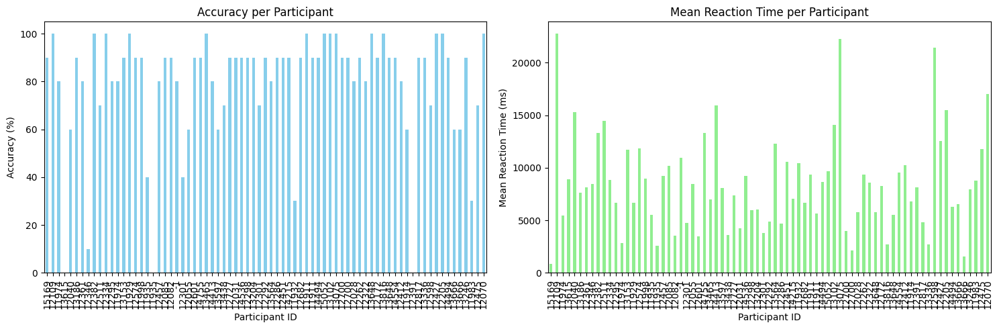

In [8]:
# Display training data summary
print("Training Data Summary:")
print(clean_dfs['training'])

# Create visualizations
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Accuracy plot
clean_dfs['training']['accuracy'].plot(kind='bar', ax=ax1, color='skyblue')
ax1.set_title('Accuracy per Participant')
ax1.set_ylabel('Accuracy (%)')
ax1.set_xlabel('Participant ID')

# Reaction time plot
clean_dfs['training']['mean_rt'].plot(kind='bar', ax=ax2, color='lightgreen')
ax2.set_title('Mean Reaction Time per Participant')
ax2.set_ylabel('Mean Reaction Time (ms)')
ax2.set_xlabel('Participant ID')

plt.tight_layout()
plt.show()


In [9]:
 # Cell 1: Helper functions for image processing
def decode_base64_image(base64_string_or_list):
    if isinstance(base64_string_or_list, list):
        base64_string = base64_string_or_list[0]
    else:
        base64_string = base64_string_or_list
    
    try:
        img_data = base64.b64decode(base64_string.split(',')[1])
    except IndexError:
        img_data = base64.b64decode(base64_string)
    
    return Image.open(BytesIO(img_data))

def create_composite_image(images):
    if not images:
        return np.zeros((16, 16), dtype=np.uint8)
    np_images = [np.array(img.convert('L').resize((16, 16))) for img in images]
    mean_image = np.mean(np.stack(np_images), axis=0)
    return mean_image.astype(np.uint8)

# Cell 3: Visualization function
def plot_participant_sessions(participant_data, participant_id):
    for session, session_data in participant_data.items():
        generations = sorted(session_data.keys())
        n_gens = len(generations)
        
        if n_gens == 0:
            print(f"No generations found for Participant {participant_id}, Session {session}")
            continue
            
        fig, axes = plt.subplots(1, n_gens, figsize=(3*n_gens, 3))
        if n_gens == 1:
            axes = [axes]
        
        for idx, gen in enumerate(generations):
            gen_images = []
            for img_base64 in session_data[gen]['selected']:
                try:
                    img = decode_base64_image(img_base64)
                    gen_images.append(img)
                except Exception as e:
                    print(f"Error processing image for Participant {participant_id}, Session {session}, Generation {gen}: {str(e)}")
                    continue
                    
            if gen_images:
                composite = create_composite_image(gen_images)
                axes[idx].imshow(composite, cmap='gray')
                axes[idx].axis('off')
                axes[idx].set_title(f'Gen {gen}')
        
        plt.suptitle(f'Participant {participant_id} - Session {session}')
        plt.tight_layout()
        plt.show()
        plt.close()



In [ ]:
# Cell 1: Combine clean participants with original data
def process_evolution_data(valid_results, clean_dfs):
    # Get list of clean participants (those who passed attention checks)
    clean_participants = clean_dfs['participants'].index.tolist()
    
    # Process only clean participants' data
    results = {}
    for result in valid_results:
        participant_id = result['metadata']['participant_id']
        if participant_id in clean_participants:  # Only process clean participants
            if 'evolution_summary' in result:
                results[participant_id] = {}
                
                for gen_data in result['evolution_summary']:
                    session = gen_data['session']
                    if session not in results[participant_id]:
                        results[participant_id][session] = {}
                    
                    generation = gen_data['generation']
                    if 'selected_parents' in gen_data:
                        results[participant_id][session][generation] = {
                            'selected': [p['filtered_image'] for p in gen_data['selected_parents']]
                        }
    
    return results

def plot_participant_sessions_with_combined(participant_data, participant_id):
    # First plot individual sessions
    for session, session_data in participant_data.items():
        generations = sorted(session_data.keys())
        n_gens = len(generations)
        
        if n_gens == 0:
            print(f"No generations found for Participant {participant_id}, Session {session}")
            continue
            
        fig, axes = plt.subplots(1, n_gens, figsize=(3*n_gens, 3))
        if n_gens == 1:
            axes = [axes]
        
        for idx, gen in enumerate(generations):
            gen_images = []
            for img_base64 in session_data[gen]['selected']:
                try:
                    img = decode_base64_image(img_base64)
                    gen_images.append(img)
                except:
                    continue
                    
            if gen_images:
                composite = create_composite_image(gen_images)
                axes[idx].imshow(composite, cmap='gray')
                axes[idx].axis('off')
                axes[idx].set_title(f'Gen {gen}')
        
        plt.suptitle(f'Participant {participant_id} - Session {session}')
        plt.tight_layout()
        plt.show()
        plt.close()

    # Then create and plot combined sessions
    combined_generations = {}
    for session, session_data in participant_data.items():
        for gen, gen_data in session_data.items():
            if gen not in combined_generations:
                combined_generations[gen] = []
            combined_generations[gen].extend(gen_data['selected'])

    # Plot combined sessions
    fig, axes = plt.subplots(1, len(combined_generations), figsize=(3*len(combined_generations), 3))
    if len(combined_generations) == 1:
        axes = [axes]

    for idx, (gen, gen_images_base64) in enumerate(sorted(combined_generations.items())):
        gen_images = []
        for img_base64 in gen_images_base64:
            try:
                img = decode_base64_image(img_base64)
                gen_images.append(img)
            except:
                continue

        if gen_images:
            composite = create_composite_image(gen_images)
            axes[idx].imshow(composite, cmap='gray')
            axes[idx].axis('off')
            axes[idx].set_title(f'Gen {gen}')

    plt.suptitle(f'Participant {participant_id} - Combined Sessions')
    plt.tight_layout()
    plt.show()
    plt.close()

# Update the visualization function in your pipeline
def visualize_clean_evolution(valid_results, clean_dfs):
    clean_participant_data = process_evolution_data(valid_results, clean_dfs)
    
    print("Clean Evolution Data Summary:")
    for participant_id, data in clean_participant_data.items():
        print(f"\nParticipant {participant_id}:")
        for session, session_data in data.items():
            print(f"  Session {session}: {len(session_data)} generations")
            print(f"  Available generations: {sorted(session_data.keys())}")
    
    for participant_id, data in clean_participant_data.items():
        print(f"\nVisualizing Participant {participant_id}")
        plot_participant_sessions_with_combined(data, participant_id)

# Run the analysis
visualize_clean_evolution(valid_results, clean_dfs)


In [30]:
def create_vviq_df(valid_results):
    """Create VVIQ DataFrame with proper attention check separation"""
    vviq_data = []
    for result in valid_results:
        participant_id = result['metadata']['participant_id']
        vviq_metadata = result['metadata'].get('vviq_data', {})
        
        # Extract attention check status
        attention_checks = vviq_metadata.get('attention_check_passed', {})
        
        for eye_condition in ['eyes_open', 'eyes_closed']:
            # Separate attention checks from regular responses
            responses = [
                r for r in vviq_metadata.get(eye_condition, [])
                if not r.get('is_attention_check', False)
            ]
            
            # Validate response count before processing
            if len(responses) != 16:
                print(f"⚠️ Participant {participant_id}: {len(responses)}/16 {eye_condition} responses")
            
            for response in responses:
                for item, rating in response.get('responses', {}).items():
                    vviq_data.append({
                        'participant_id': participant_id,
                        'condition': eye_condition,
                        'question_index': response.get('question_index'),
                        'item': item,
                        'rating': rating,
                        'is_attention_check': False,
                        'attention_check_passed': attention_checks.get(eye_condition, False)
                    })
            
            # Process attention checks separately
            ac_responses = [
                r for r in vviq_metadata.get(eye_condition, [])
                if r.get('is_attention_check', False)
            ]
            for ac in ac_responses:
                for item, rating in ac.get('responses', {}).items():
                    vviq_data.append({
                        'participant_id': participant_id,
                        'condition': eye_condition,
                        'question_index': ac.get('question_index'),
                        'item': item,
                        'rating': rating,
                        'is_attention_check': True,
                        'attention_check_passed': attention_checks.get(eye_condition, False)
                    })

    return pd.DataFrame(vviq_data)

In [32]:
# Separate regular responses from attention checks
responses = [r for r in vviq_metadata.get(eye_condition, []) 
            if not r.get('is_attention_check', False)]
ac_responses = [r for r in vviq_metadata.get(eye_condition, []) 
               if r.get('is_attention_check', False)]

NameError: name 'vviq_metadata' is not defined

In [29]:
def analyze_vviq_scores(clean_dfs):
    """Analyze VVIQ scores with proper summation and validation"""
    vviq_df = clean_dfs['vviq']
    
    vviq_scores = {}
    for participant_id in clean_dfs['participants'].index:
        participant_data = vviq_df[vviq_df['participant_id'] == participant_id]
        
        scores = {
            'eyes_open': {'total': 0, 'valid': False},
            'eyes_closed': {'total': 0, 'valid': False}
        }
        
        # Process each condition separately
        for condition in ['eyes_open', 'eyes_closed']:
            condition_data = participant_data[participant_data['condition'] == condition]
            raw_scores = condition_data['rating'].dropna().astype(int)
            
            # Validate exactly 16 responses per condition
            if len(raw_scores) == 16:
                scores[condition]['total'] = raw_scores.sum()
                scores[condition]['valid'] = True
            else:
                print(f"⚠️ Participant {participant_id}: {len(raw_scores)}/{16} {condition} responses")
                
        # Calculate valid total score only if both conditions are valid
        if scores['eyes_open']['valid'] and scores['eyes_closed']['valid']:
            total_score = (scores['eyes_open']['total'] + 
                          scores['eyes_closed']['total'])
        else:
            total_score = np.nan
            
        vviq_scores[participant_id] = {
            'eyes_open_total': scores['eyes_open']['total'],
            'eyes_closed_total': scores['eyes_closed']['total'],
            'total_score': total_score,
            'valid': all([scores[c]['valid'] for c in ['eyes_open', 'eyes_closed']])
        }

    # Create summary DataFrame
    summary_df = pd.DataFrame.from_dict(vviq_scores, orient='index')
    
    # Remove invalid participants
    valid_summary = summary_df[summary_df['valid']].drop(columns='valid')
    
    # Print validation report
    print(f"\nValidation Report:")
    print(f"Total participants: {len(summary_df)}")
    print(f"Valid participants: {len(valid_summary)}")
    print(f"Excluded participants: {len(summary_df) - len(valid_summary)}")
    
    # Print score statistics
    print("\nScore Ranges (Valid Participants Only):")
    print(valid_summary.agg(['min', 'max']).astype(int))
    
    # Create visualization
    plt.figure(figsize=(12, 6))
    valid_summary[['eyes_open_total', 'eyes_closed_total']].plot(kind='bar')
    plt.axhline(32, color='red', linestyle='--', label='Minimum (32)')
    plt.axhline(160, color='green', linestyle='--', label='Maximum (160)')
    plt.title('VVIQ Scores by Condition')
    plt.ylabel('Total Score')
    plt.xlabel('Participant ID')
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    return valid_summary

# Run the corrected analysis
vviq_summary = analyze_vviq_scores(clean_dfs)

⚠️ Participant 4737: 17/16 eyes_open responses
⚠️ Participant 4737: 17/16 eyes_closed responses
⚠️ Participant 4739: 17/16 eyes_open responses
⚠️ Participant 4739: 17/16 eyes_closed responses
⚠️ Participant 15169: 17/16 eyes_open responses
⚠️ Participant 15169: 17/16 eyes_closed responses
⚠️ Participant 12109: 17/16 eyes_open responses
⚠️ Participant 12109: 17/16 eyes_closed responses
⚠️ Participant 11974: 34/16 eyes_open responses
⚠️ Participant 11974: 34/16 eyes_closed responses
⚠️ Participant 13615: 17/16 eyes_open responses
⚠️ Participant 13615: 17/16 eyes_closed responses
⚠️ Participant 12040: 17/16 eyes_open responses
⚠️ Participant 12040: 17/16 eyes_closed responses
⚠️ Participant 13186: 17/16 eyes_open responses
⚠️ Participant 13186: 17/16 eyes_closed responses
⚠️ Participant 12361: 17/16 eyes_open responses
⚠️ Participant 12361: 17/16 eyes_closed responses
⚠️ Participant 12346: 17/16 eyes_open responses
⚠️ Participant 12346: 17/16 eyes_closed responses
⚠️ Participant 12382: 17

IntCastingNaNError: Cannot convert non-finite values (NA or inf) to integer


Correlations with Training Accuracy:

eyes_open_mean:
r = -0.022
p = 0.849

eyes_closed_mean:
r = 0.125
p = 0.287

total_mean:
r = 0.072
p = 0.537


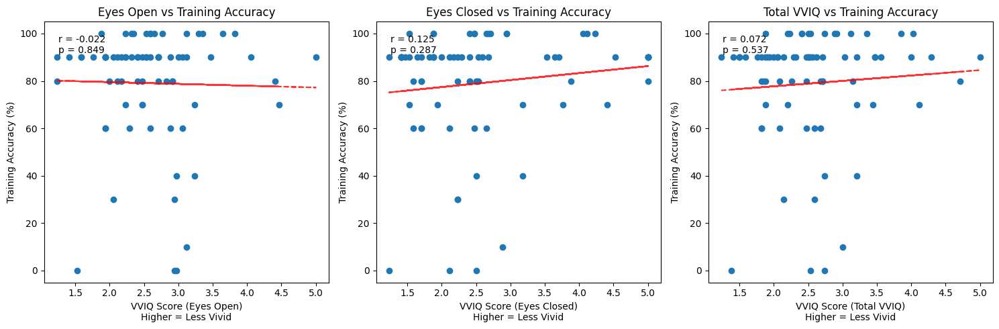

In [12]:
def correlate_vviq_training(clean_dfs, vviq_summary):
    # Get training accuracy and reset index to avoid duplicates
    training_accuracy = clean_dfs['training']['accuracy'].reset_index()
    vviq_data = vviq_summary.reset_index()
    
    # Merge data on participant_id
    correlation_df = pd.merge(
        training_accuracy, 
        vviq_data,
        on='participant_id'
    )
    
    # Calculate correlations
    correlations = {}
    p_values = {}
    for vviq_measure in ['eyes_open_mean', 'eyes_closed_mean', 'total_mean']:
        r, p = stats.pearsonr(correlation_df['accuracy'], 
                            correlation_df[vviq_measure])
        correlations[vviq_measure] = r
        p_values[vviq_measure] = p
    
    # Print results
    print("\nCorrelations with Training Accuracy:")
    for measure in correlations:
        print(f"\n{measure}:")
        print(f"r = {correlations[measure]:.3f}")
        print(f"p = {p_values[measure]:.3f}")
    
    # Create scatter plots
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    measures = ['eyes_open_mean', 'eyes_closed_mean', 'total_mean']
    titles = ['Eyes Open', 'Eyes Closed', 'Total VVIQ']
    
    for ax, measure, title in zip(axes, measures, titles):
        ax.scatter(correlation_df[measure], correlation_df['accuracy'])
        ax.set_xlabel(f'VVIQ Score ({title})\nHigher = Less Vivid')
        ax.set_ylabel('Training Accuracy (%)')
        ax.set_title(f'{title} vs Training Accuracy')
        
        # Add trend line
        z = np.polyfit(correlation_df[measure], correlation_df['accuracy'], 1)
        p = np.poly1d(z)
        ax.plot(correlation_df[measure], p(correlation_df[measure]), "r--", alpha=0.8)
        
        # Add correlation coefficient and p-value
        ax.text(0.05, 0.95, f'r = {correlations[measure]:.3f}\np = {p_values[measure]:.3f}', 
                transform=ax.transAxes, verticalalignment='top')
    
    plt.tight_layout()
    plt.show()
    
    return correlation_df, correlations, p_values

# Run the correlation analysis
from scipy import stats
correlation_results = correlate_vviq_training(clean_dfs, vviq_summary)

Removed 8 participants with accuracy below 50%


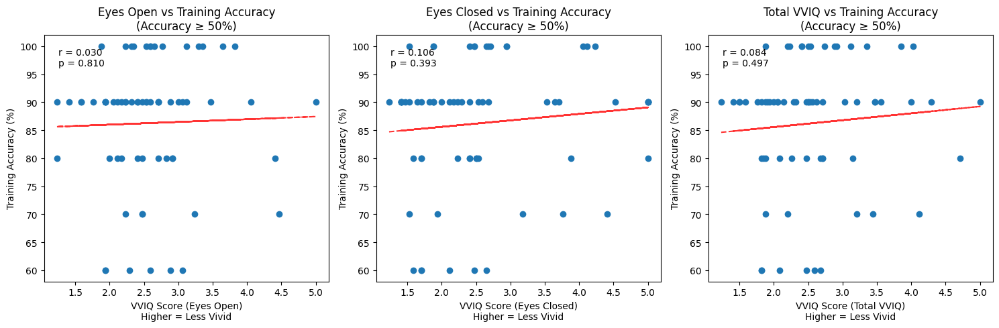

In [13]:
def correlate_vviq_training_filtered(clean_dfs, vviq_summary, accuracy_threshold=50):
    # Get training accuracy and reset index
    training_accuracy = clean_dfs['training']['accuracy'].reset_index()
    vviq_data = vviq_summary.reset_index()
    
    # Merge data and filter by accuracy threshold
    correlation_df = pd.merge(training_accuracy, vviq_data, on='participant_id')
    filtered_df = correlation_df[correlation_df['accuracy'] >= accuracy_threshold]
    
    print(f"Removed {len(correlation_df) - len(filtered_df)} participants with accuracy below {accuracy_threshold}%")
    
    # Calculate correlations with filtered data
    correlations = {}
    p_values = {}
    for vviq_measure in ['eyes_open_mean', 'eyes_closed_mean', 'total_mean']:
        r, p = stats.pearsonr(filtered_df['accuracy'], 
                            filtered_df[vviq_measure])
        correlations[vviq_measure] = r
        p_values[vviq_measure] = p
    
    # Create scatter plots with filtered data
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    measures = ['eyes_open_mean', 'eyes_closed_mean', 'total_mean']
    titles = ['Eyes Open', 'Eyes Closed', 'Total VVIQ']
    
    for ax, measure, title in zip(axes, measures, titles):
        ax.scatter(filtered_df[measure], filtered_df['accuracy'])
        ax.set_xlabel(f'VVIQ Score ({title})\nHigher = Less Vivid')
        ax.set_ylabel('Training Accuracy (%)')
        ax.set_title(f'{title} vs Training Accuracy\n(Accuracy ≥ {accuracy_threshold}%)')
        
        # Add trend line
        z = np.polyfit(filtered_df[measure], filtered_df['accuracy'], 1)
        p = np.poly1d(z)
        ax.plot(filtered_df[measure], p(filtered_df[measure]), "r--", alpha=0.8)
        
        # Add correlation coefficient and p-value
        ax.text(0.05, 0.95, f'r = {correlations[measure]:.3f}\np = {p_values[measure]:.3f}', 
                transform=ax.transAxes, verticalalignment='top')
    
    plt.tight_layout()
    plt.show()
    
    return filtered_df, correlations, p_values

# Run the filtered analysis
filtered_results = correlate_vviq_training_filtered(clean_dfs, vviq_summary, accuracy_threshold=50)


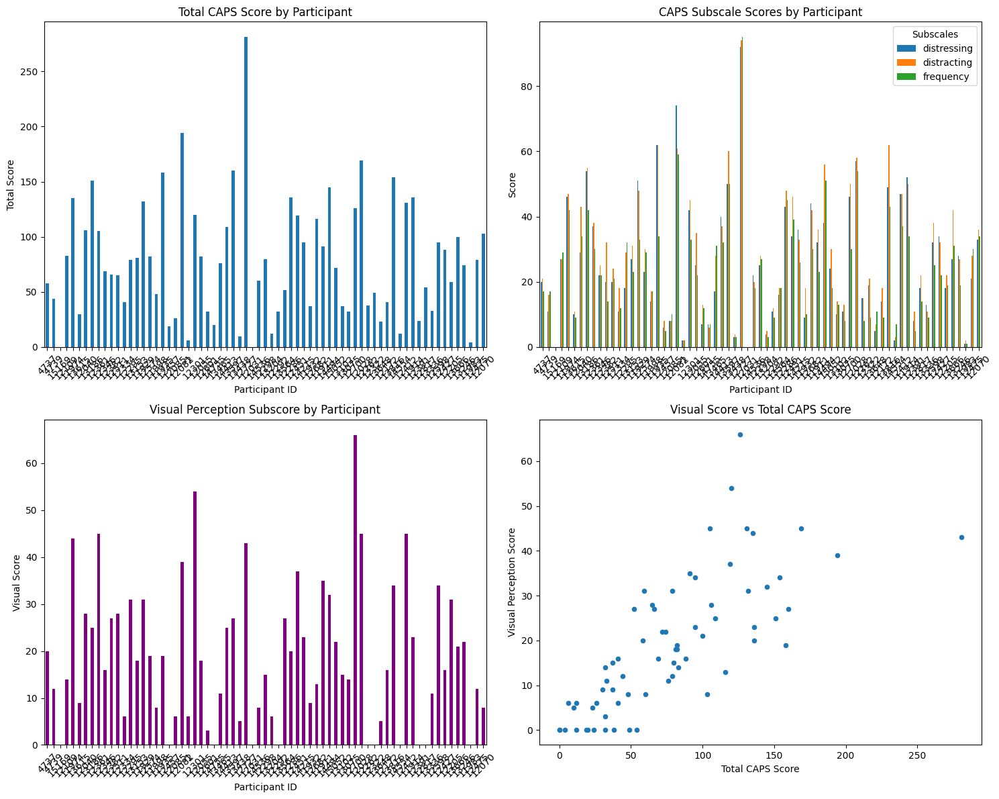


CAPS Score Summary (including Visual Subscale):

Subscale Statistics:
       distressing  distracting  frequency  visual_score  total_score
count        69.00        69.00      69.00         69.00        69.00
mean         25.70        28.93      23.29         18.87        77.91
std          18.89        19.03      16.65         15.05        53.52
min           0.00         0.00       0.00          0.00         0.00
25%          11.00        14.00      10.00          6.00        37.00
50%          22.00        28.00      22.00         16.00        74.00
75%          37.00        42.00      32.00         28.00       109.00
max          92.00        94.00      95.00         66.00       281.00


In [14]:
def analyze_caps_scores(clean_dfs):
    """Analyze CAPS scores with subscales and visual perception items"""
    caps_df = clean_dfs['caps'].copy()
    
    # Define visual perception questions
    visual_questions = [4, 19, 22, 23, 26, 31]
    
    # Initialize subscale scores
    subscale_totals = {}
    for participant_id in caps_df['participant_id'].unique():
        participant_data = caps_df[caps_df['participant_id'] == participant_id]
        
        # Initialize subscale sums
        subscale_sums = {
            'distressing': 0,
            'distracting': 0,
            'frequency': 0,
            'visual_score': 0  # New visual subscore
        }
        
        # Sum up subscales for 'yes' responses
        for _, row in participant_data.iterrows():
            if row['response'] == 'yes' and row['subscale'] is not None:
                for subscale, value in row['subscale'].items():
                    subscale_sums[subscale] += value
                # Add to visual score if it's a visual question
                if row['question_index'] in visual_questions:
                    subscale_sums['visual_score'] += sum(row['subscale'].values())
        
        subscale_totals[participant_id] = subscale_sums
    
    # Convert to DataFrame
    caps_summary = pd.DataFrame.from_dict(subscale_totals, orient='index')
    caps_summary['total_score'] = caps_summary[['distressing', 'distracting', 'frequency']].sum(axis=1)
    
    # Create visualization
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
    
    # Plot total scores
    caps_summary['total_score'].plot(kind='bar', ax=ax1)
    ax1.set_title('Total CAPS Score by Participant')
    ax1.set_xlabel('Participant ID')
    ax1.set_ylabel('Total Score')
    ax1.tick_params(axis='x', rotation=45)
    
    # Plot subscale scores
    caps_summary[['distressing', 'distracting', 'frequency']].plot(kind='bar', ax=ax2)
    ax2.set_title('CAPS Subscale Scores by Participant')
    ax2.set_xlabel('Participant ID')
    ax2.set_ylabel('Score')
    ax2.tick_params(axis='x', rotation=45)
    ax2.legend(title='Subscales')
    
    # Plot visual perception scores
    caps_summary['visual_score'].plot(kind='bar', ax=ax3, color='purple')
    ax3.set_title('Visual Perception Subscore by Participant')
    ax3.set_xlabel('Participant ID')
    ax3.set_ylabel('Visual Score')
    ax3.tick_params(axis='x', rotation=45)
    
    # Plot visual score vs total score
    caps_summary.plot(kind='scatter', x='total_score', y='visual_score', ax=ax4)
    ax4.set_title('Visual Score vs Total CAPS Score')
    ax4.set_xlabel('Total CAPS Score')
    ax4.set_ylabel('Visual Perception Score')
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print("\nCAPS Score Summary (including Visual Subscale):")
    print("\nSubscale Statistics:")
    print(caps_summary.describe().round(2))
    
    return caps_summary

# Run the analysis
caps_summary = analyze_caps_scores(clean_dfs)

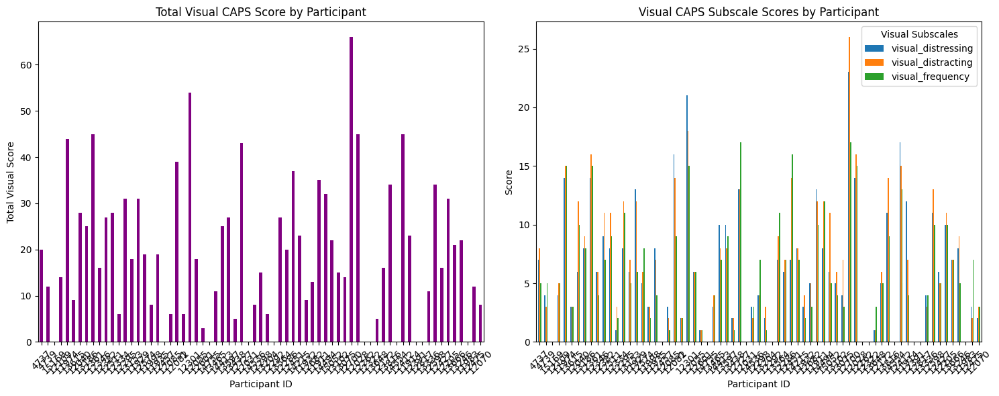


Visual CAPS Subscale Summary:

Subscale Statistics:
       visual_distressing  visual_distracting  visual_frequency  visual_total
count               69.00               69.00             69.00         69.00
mean                 6.22                6.80              5.86         18.87
std                  5.24                5.54              4.79         15.05
min                  0.00                0.00              0.00          0.00
25%                  2.00                2.00              2.00          6.00
50%                  6.00                6.00              5.00         16.00
75%                  8.00               11.00              9.00         28.00
max                 23.00               26.00             17.00         66.00


In [15]:
def analyze_caps_visual_scores(clean_dfs):
    """Analyze CAPS visual scores with detailed subscale breakdown"""
    caps_df = clean_dfs['caps'].copy()
    
    # Define visual perception questions
    visual_questions = [4, 19, 22, 23, 26, 31]
    
    # Initialize visual subscale scores
    visual_subscale_totals = {}
    for participant_id in caps_df['participant_id'].unique():
        participant_data = caps_df[caps_df['participant_id'] == participant_id]
        
        # Initialize visual subscale sums
        visual_sums = {
            'visual_distressing': 0,
            'visual_distracting': 0,
            'visual_frequency': 0
        }
        
        # Sum up subscales for visual questions only
        for _, row in participant_data.iterrows():
            if (row['question_index'] in visual_questions and 
                row['response'] == 'yes' and 
                row['subscale'] is not None):
                visual_sums['visual_distressing'] += row['subscale']['distressing']
                visual_sums['visual_distracting'] += row['subscale']['distracting']
                visual_sums['visual_frequency'] += row['subscale']['frequency']
        
        visual_subscale_totals[participant_id] = visual_sums
    
    # Convert to DataFrame
    visual_summary = pd.DataFrame.from_dict(visual_subscale_totals, orient='index')
    visual_summary['visual_total'] = visual_summary.sum(axis=1)
    
    # Create visualization
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot total visual scores
    visual_summary['visual_total'].plot(kind='bar', ax=ax1, color='purple')
    ax1.set_title('Total Visual CAPS Score by Participant')
    ax1.set_xlabel('Participant ID')
    ax1.set_ylabel('Total Visual Score')
    ax1.tick_params(axis='x', rotation=45)
    
    # Plot visual subscale scores
    visual_summary[['visual_distressing', 'visual_distracting', 'visual_frequency']].plot(
        kind='bar', ax=ax2)
    ax2.set_title('Visual CAPS Subscale Scores by Participant')
    ax2.set_xlabel('Participant ID')
    ax2.set_ylabel('Score')
    ax2.tick_params(axis='x', rotation=45)
    ax2.legend(title='Visual Subscales')
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print("\nVisual CAPS Subscale Summary:")
    print("\nSubscale Statistics:")
    print(visual_summary.describe().round(2))
    
    return visual_summary

# Run the visual analysis
visual_caps_summary = analyze_caps_visual_scores(clean_dfs)

In [16]:
correlation_df = correlation_df = pd.DataFrame({
        'VVIQ_Eyes_Open': vviq_summary['eyes_open_mean'],
        'VVIQ_Eyes_Closed': vviq_summary['eyes_closed_mean'],
        'VVIQ_Total': vviq_summary['total_mean'],
        'CAPS_Total': caps_summary['total_score'],
        'Visual_CAPS_Total': visual_caps_summary['visual_total']
    })

In [17]:
correlation_df

,VVIQ_Eyes_Open,VVIQ_Eyes_Closed,VVIQ_Total,CAPS_Total,Visual_CAPS_Total
4737,3.176471,2.882353,3.029412,58,20
4739,2.176471,1.294118,1.735294,44,12
15169,1.235294,1.235294,1.235294,0,0
12109,2.352941,2.470588,2.411765,83,14
11974,2.911765,2.500000,2.705882,135,44
...,...,...,...,...,...
13666,1.941176,1.705882,1.823529,100,21
13246,2.705882,2.235294,2.470588,74,22
11983,2.058824,2.235294,2.147059,4,0
12475,2.470588,4.411765,3.441176,79,12


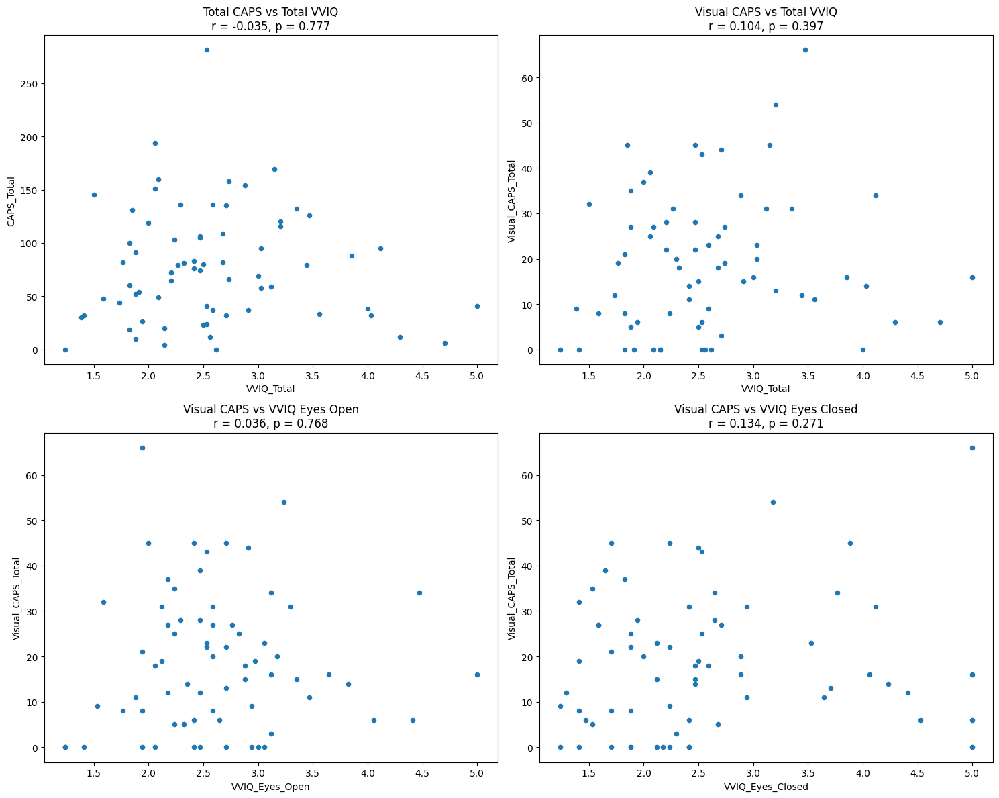

In [18]:
def correlate_caps_vviq(caps_summary, visual_caps_summary, vviq_summary):
    # Prepare correlation data
    correlation_df = pd.DataFrame({
        'VVIQ_Eyes_Open': vviq_summary['eyes_open_mean'],
        'VVIQ_Eyes_Closed': vviq_summary['eyes_closed_mean'],
        'VVIQ_Total': vviq_summary['total_mean'],
        'CAPS_Total': caps_summary['total_score'],
        'Visual_CAPS_Total': visual_caps_summary['visual_total']
    })
    
    # Calculate correlations
    correlations = {}
    p_values = {}
    for caps_measure in ['CAPS_Total', 'Visual_CAPS_Total']:
        for vviq_measure in ['VVIQ_Eyes_Open', 'VVIQ_Eyes_Closed', 'VVIQ_Total']:
            r, p = stats.pearsonr(correlation_df[vviq_measure], 
                                correlation_df[caps_measure])
            correlations[f"{caps_measure}_{vviq_measure}"] = r
            p_values[f"{caps_measure}_{vviq_measure}"] = p
    
    # Create visualization
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
    
    # Total CAPS vs VVIQ
    correlation_df.plot.scatter('VVIQ_Total', 'CAPS_Total', ax=ax1)
    r = correlations['CAPS_Total_VVIQ_Total']
    p = p_values['CAPS_Total_VVIQ_Total']
    ax1.set_title(f'Total CAPS vs Total VVIQ\nr = {r:.3f}, p = {p:.3f}')
    
    # Visual CAPS vs VVIQ
    correlation_df.plot.scatter('VVIQ_Total', 'Visual_CAPS_Total', ax=ax2)
    r = correlations['Visual_CAPS_Total_VVIQ_Total']
    p = p_values['Visual_CAPS_Total_VVIQ_Total']
    ax2.set_title(f'Visual CAPS vs Total VVIQ\nr = {r:.3f}, p = {p:.3f}')
    
    # Eyes Open correlations
    correlation_df.plot.scatter('VVIQ_Eyes_Open', 'Visual_CAPS_Total', ax=ax3)
    r = correlations['Visual_CAPS_Total_VVIQ_Eyes_Open']
    p = p_values['Visual_CAPS_Total_VVIQ_Eyes_Open']
    ax3.set_title(f'Visual CAPS vs VVIQ Eyes Open\nr = {r:.3f}, p = {p:.3f}')
    
    # Eyes Closed correlations
    correlation_df.plot.scatter('VVIQ_Eyes_Closed', 'Visual_CAPS_Total', ax=ax4)
    r = correlations['Visual_CAPS_Total_VVIQ_Eyes_Closed']
    p = p_values['Visual_CAPS_Total_VVIQ_Eyes_Closed']
    ax4.set_title(f'Visual CAPS vs VVIQ Eyes Closed\nr = {r:.3f}, p = {p:.3f}')
    
    plt.tight_layout()
    plt.show()
    
    return correlation_df, correlations, p_values

# Run the correlation analysis
correlation_results = correlate_caps_vviq(caps_summary, visual_caps_summary, vviq_summary)


In [19]:
def categorize_vviq(vviq_summary):
    thresholds = {
        'low': (1.0, 2.0),    # More vivid imagery
        'medium': (2.0, 3.0),  # Moderate imagery
        'high': (3.0, 4.0)     # Less vivid imagery
    }
    
    vviq_summary['group'] = 'unknown'
    for group, (lower, upper) in thresholds.items():
        vviq_summary.loc[(vviq_summary['total_mean'] >= lower) & 
                        (vviq_summary['total_mean'] < upper), 'group'] = group
    
    return vviq_summary



Classification Images for Group: high_vivid
Number of participants: 16

Participant 4739 (VVIQ Score: 1.74)


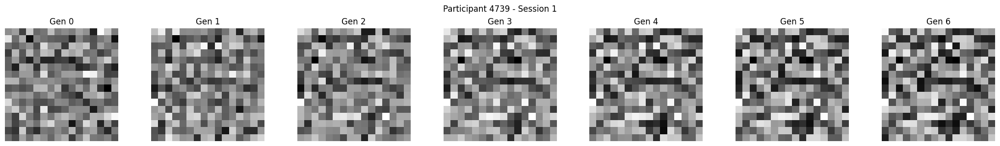

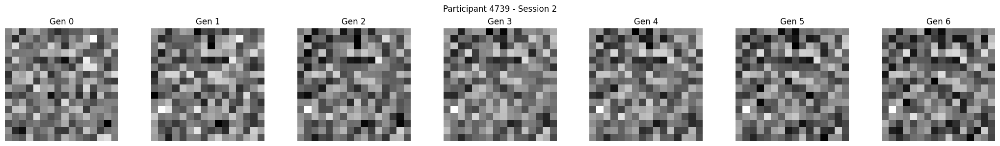

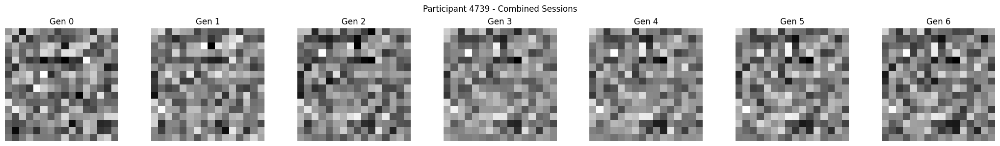


Participant 15169 (VVIQ Score: 1.24)


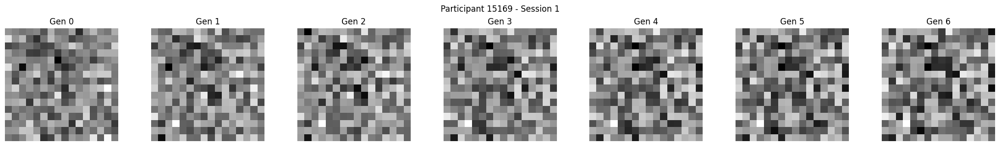

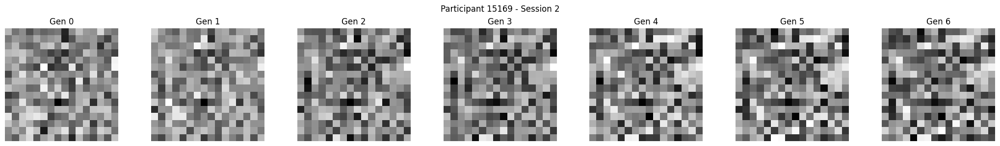

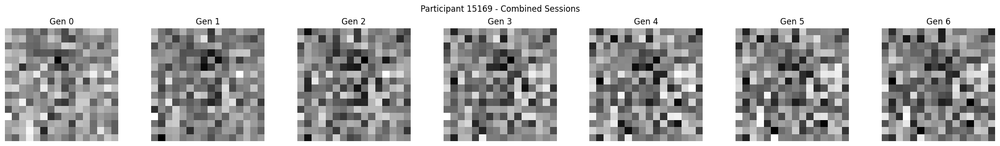


Participant 13615 (VVIQ Score: 1.38)


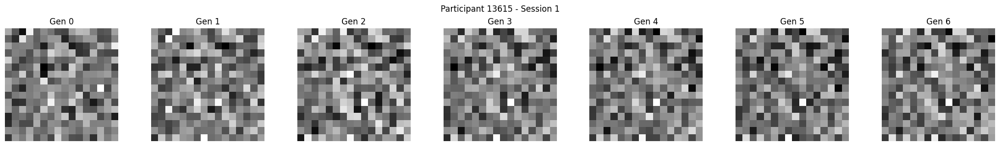

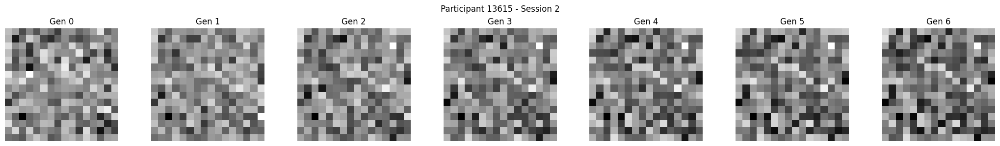

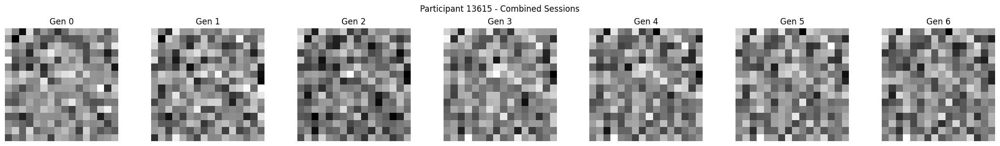


Participant 12574 (VVIQ Score: 1.76)


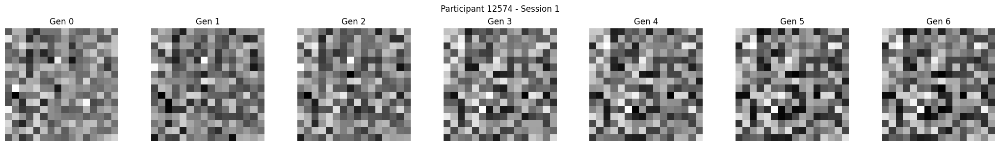

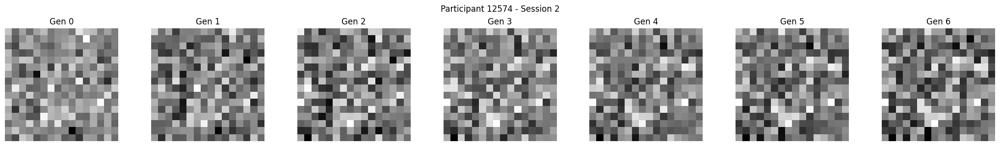

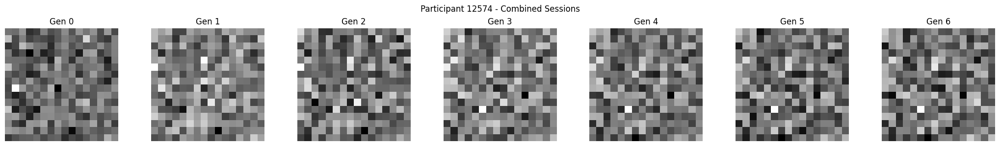


Participant 11998 (VVIQ Score: 1.59)


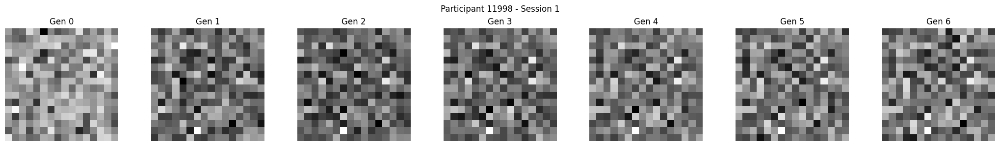

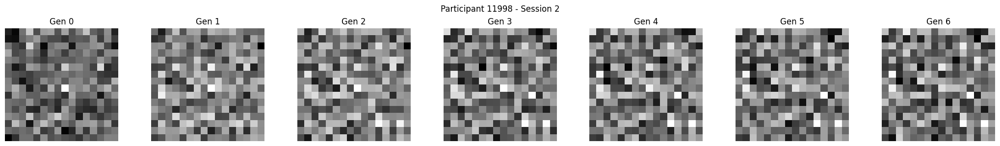

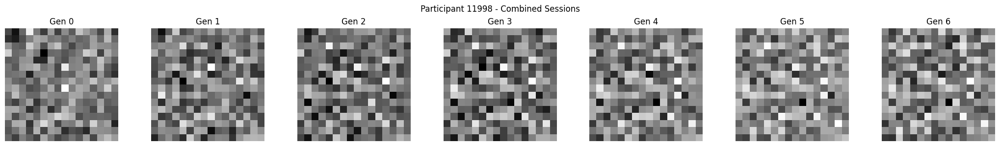


Participant 12457 (VVIQ Score: 1.82)


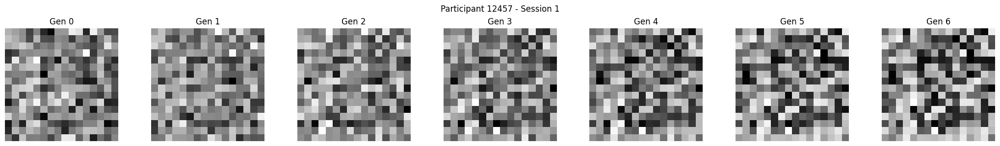

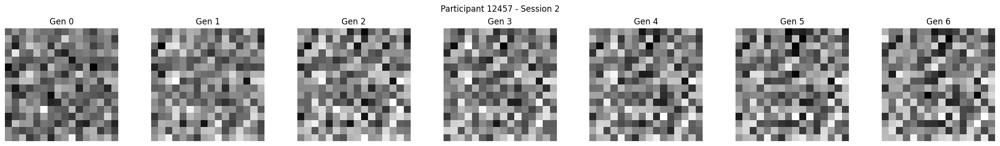

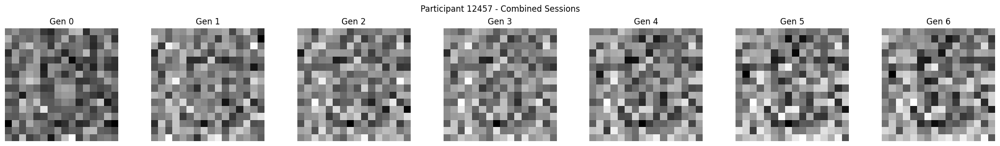


Participant 12085 (VVIQ Score: 1.94)


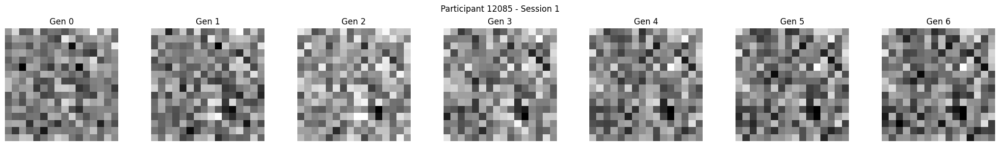

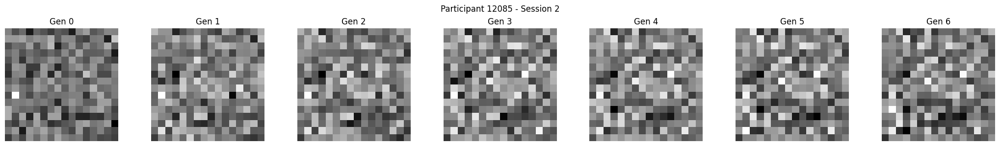

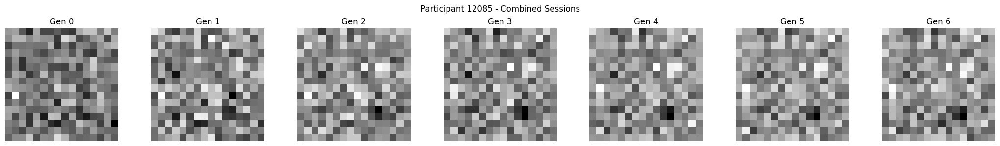


Participant 13438 (VVIQ Score: 1.88)


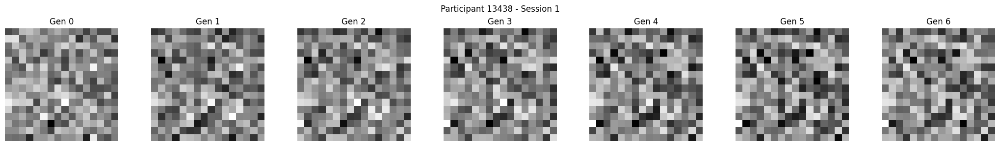

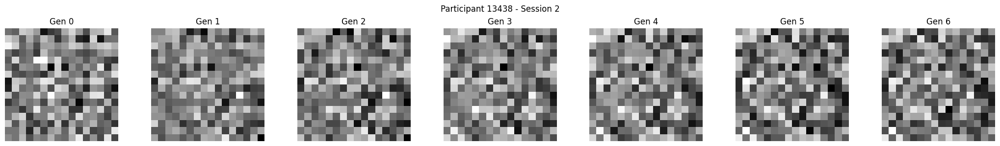

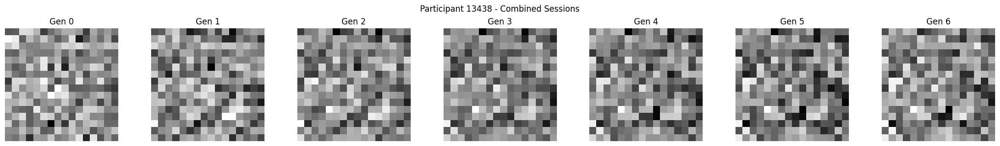


Participant 14536 (VVIQ Score: 1.82)


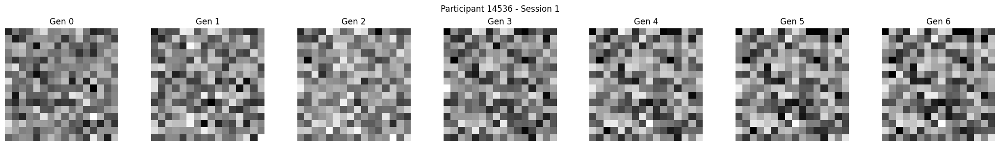

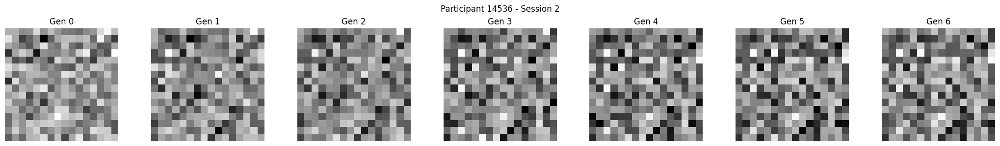

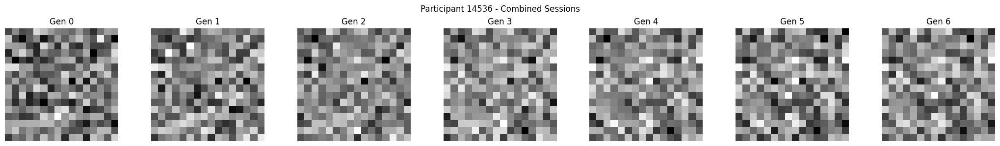


Participant 12292 (VVIQ Score: 1.41)


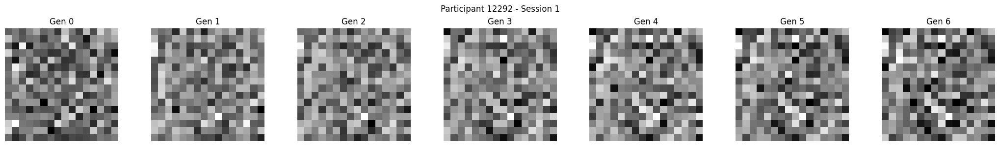

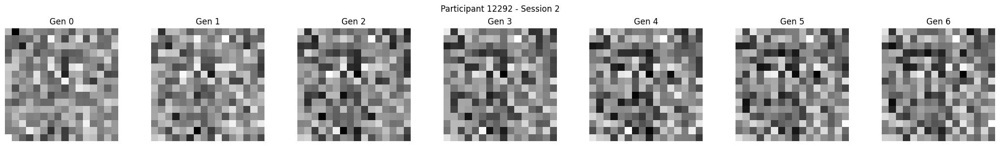

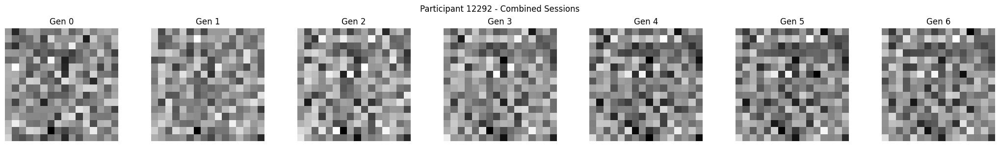


Participant 13564 (VVIQ Score: 1.88)


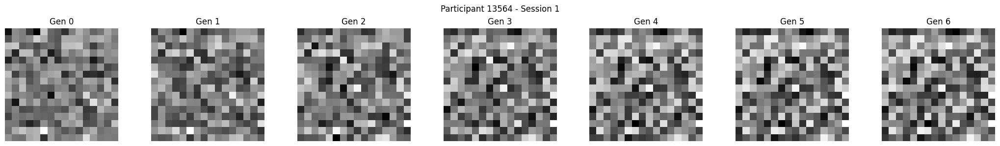

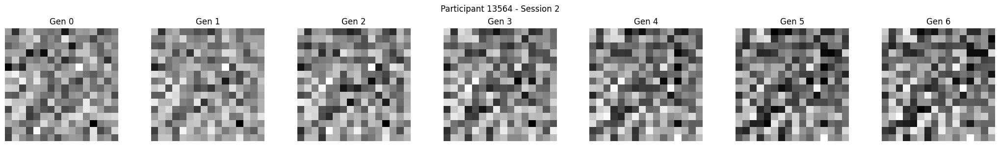

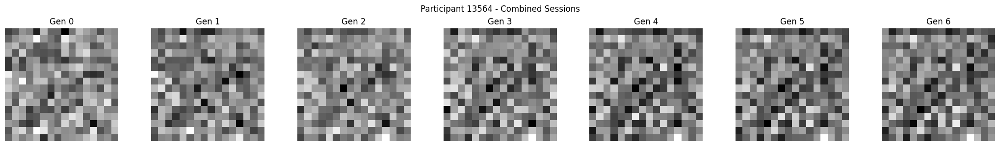


Participant 11911 (VVIQ Score: 1.88)


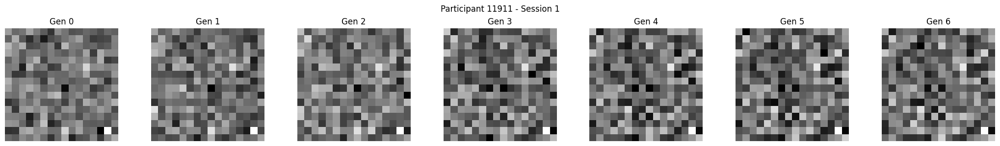

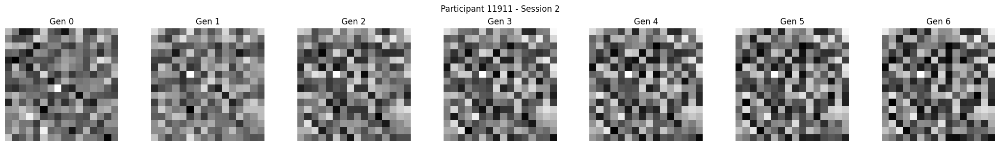

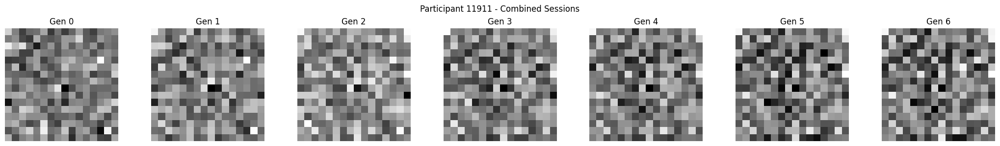


Participant 14494 (VVIQ Score: 1.50)


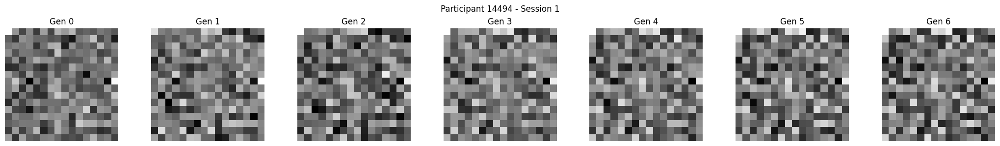

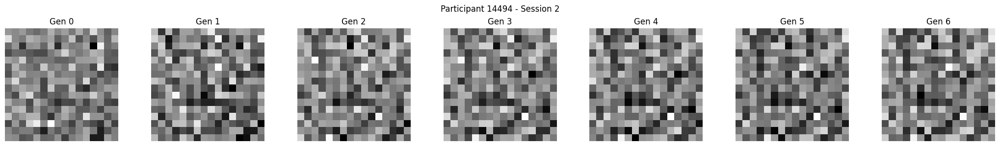

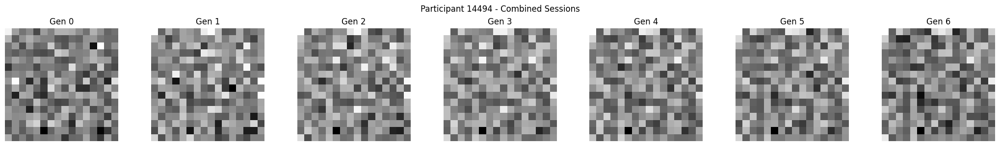


Participant 12412 (VVIQ Score: 1.85)


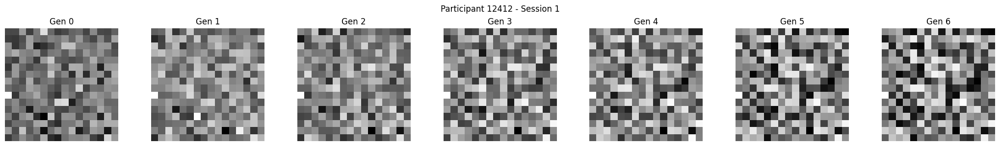

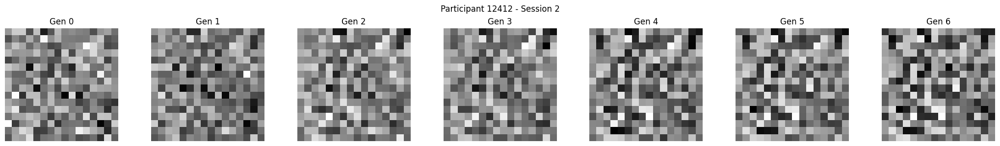

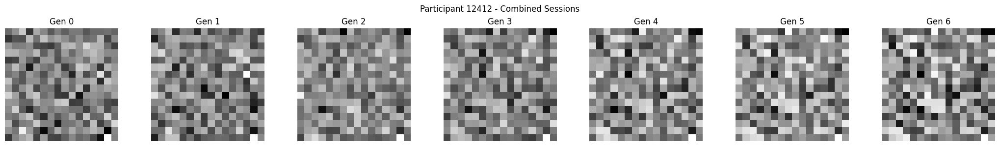


Participant 12817 (VVIQ Score: 1.91)


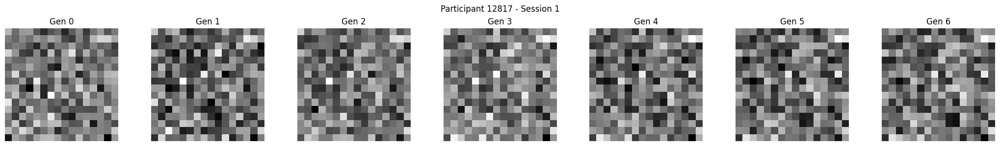

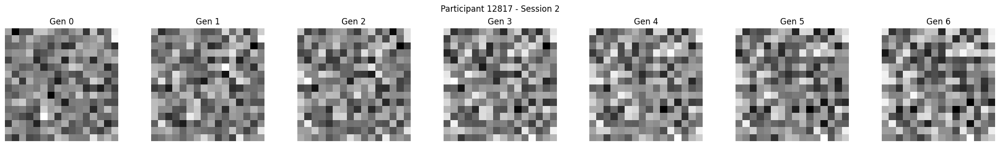

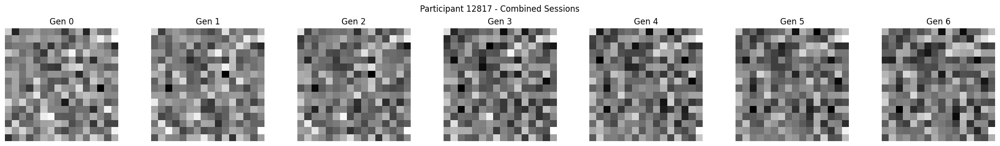


Participant 13666 (VVIQ Score: 1.82)


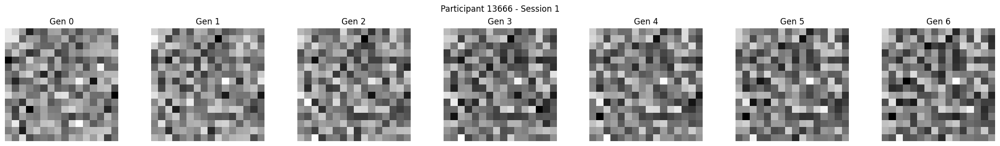

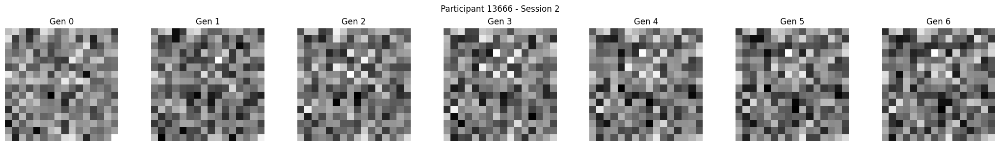

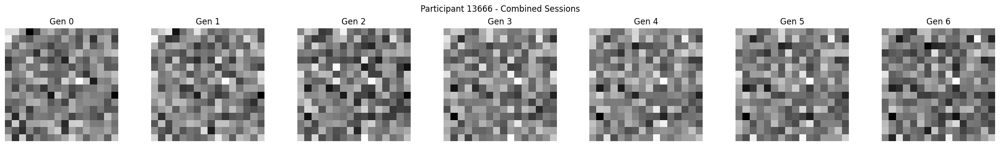


Classification Images for Group: medium_vivid
Number of participants: 35

Participant 12109 (VVIQ Score: 2.41)


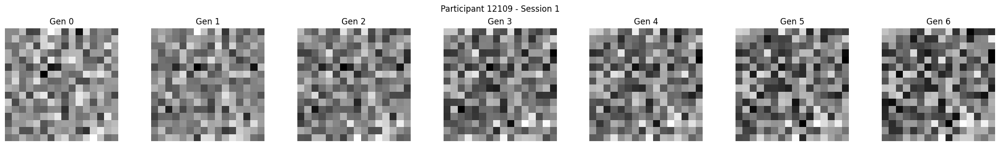

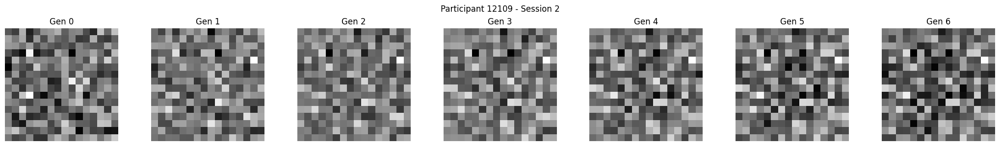

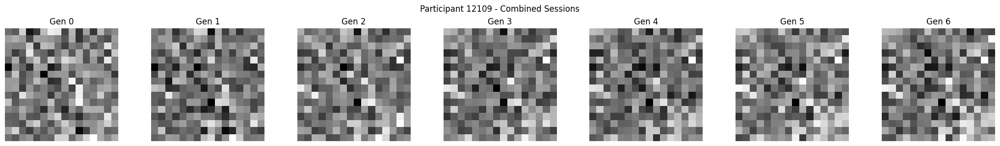


Participant 11974 (VVIQ Score: 2.71)


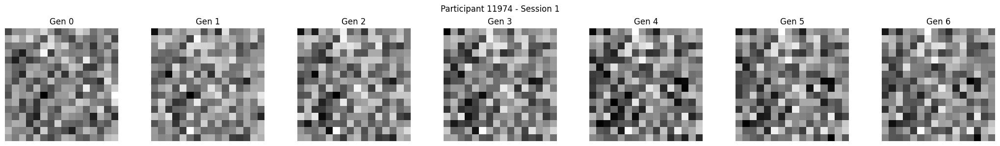

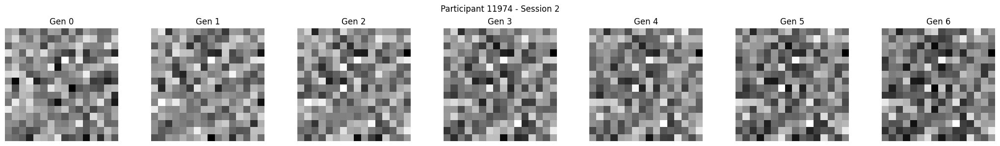

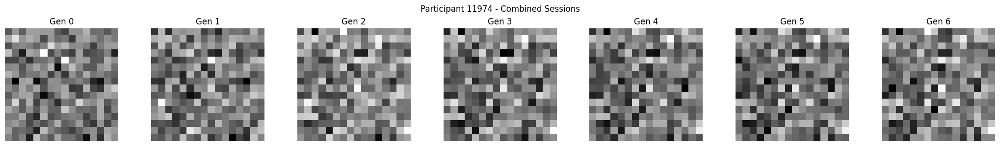


Participant 12040 (VVIQ Score: 2.47)


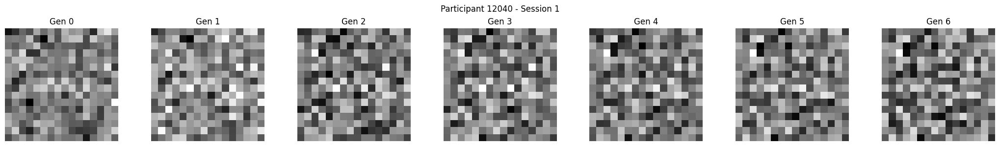

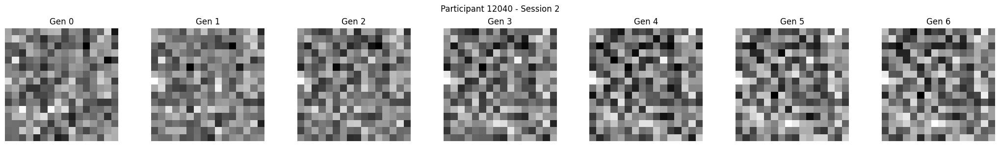

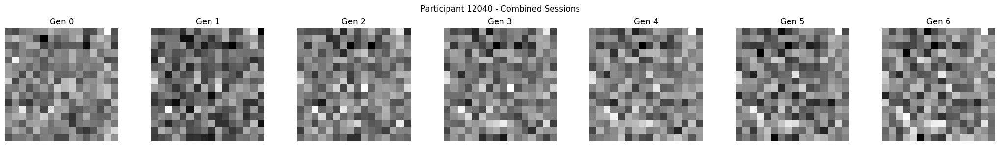


Participant 13186 (VVIQ Score: 2.06)


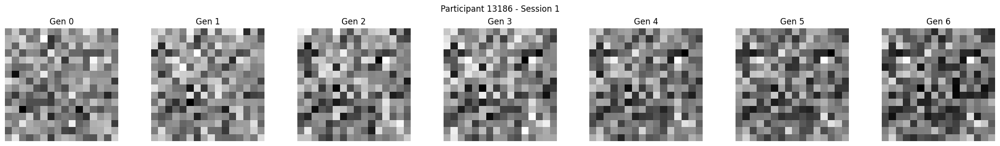

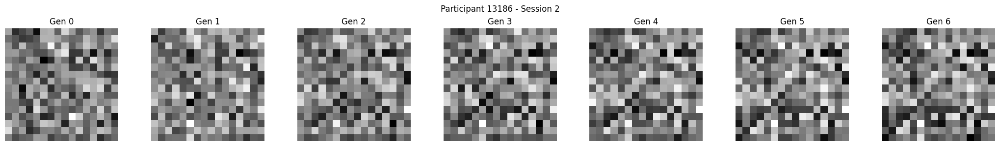

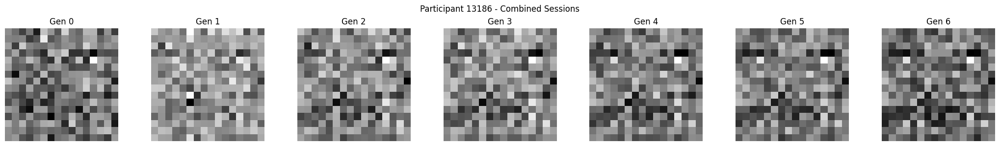


Participant 12361 (VVIQ Score: 2.47)


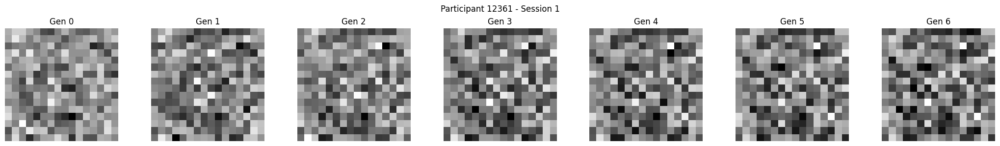

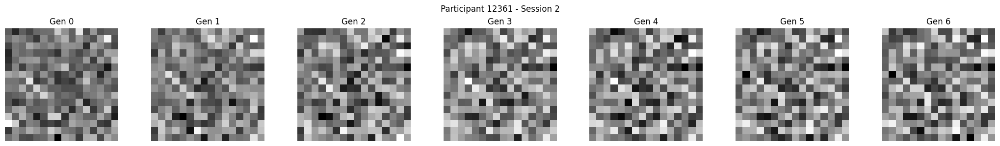

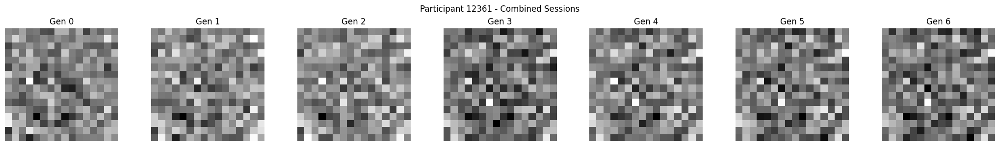


Participant 12382 (VVIQ Score: 2.74)


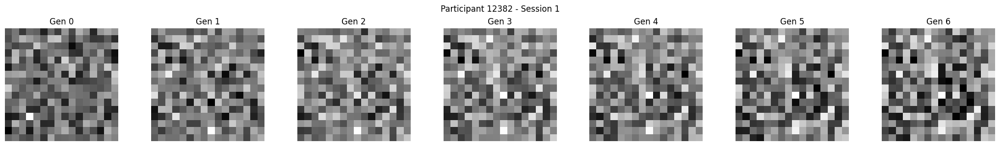

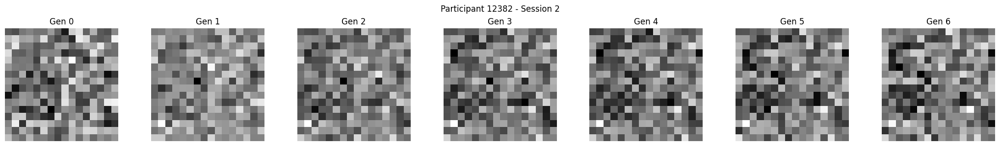

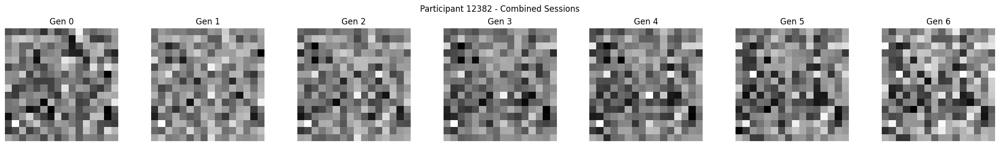


Participant 12511 (VVIQ Score: 2.21)


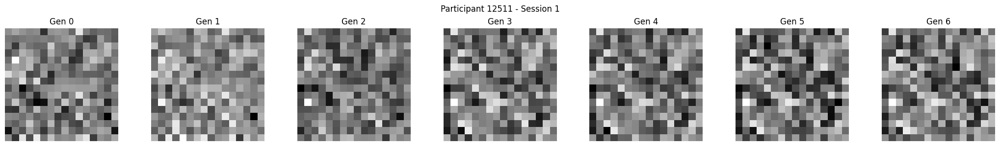

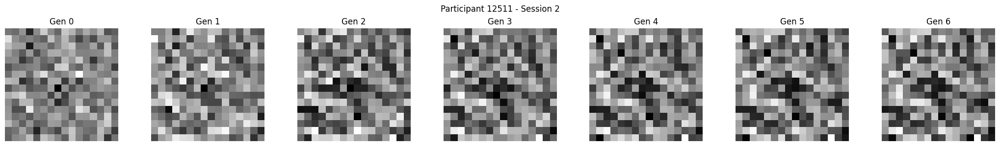

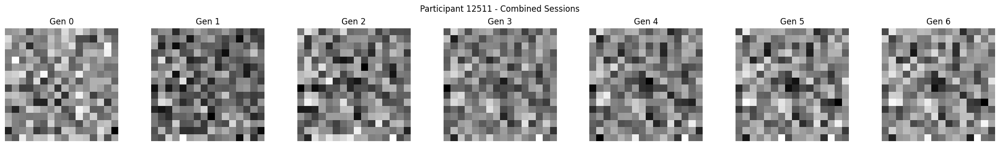


Participant 12334 (VVIQ Score: 2.53)


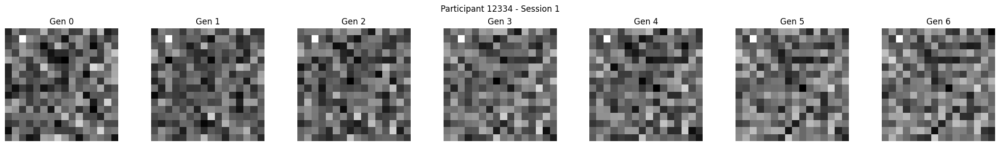

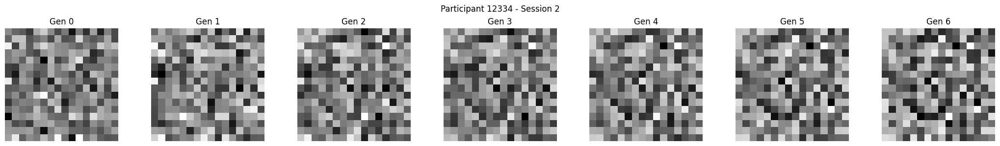

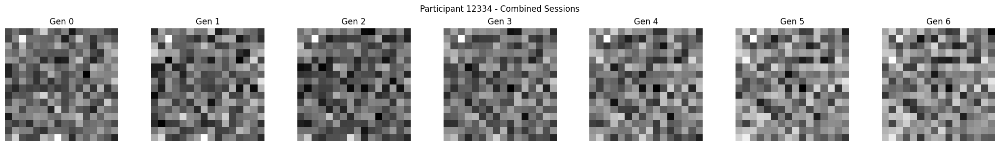


Participant 12295 (VVIQ Score: 2.26)


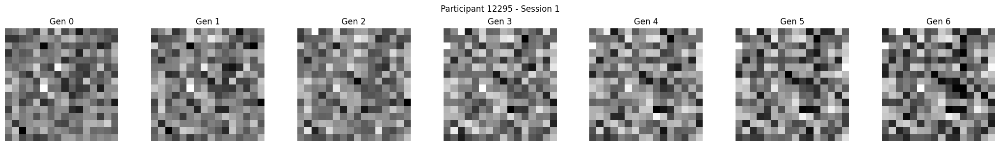

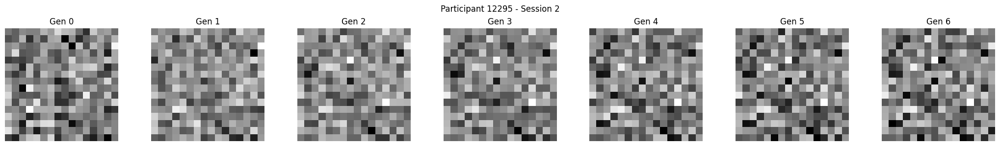

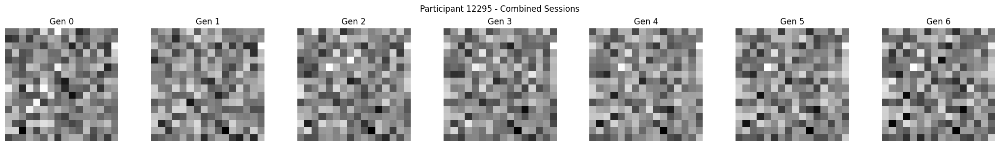


Participant 13153 (VVIQ Score: 2.32)


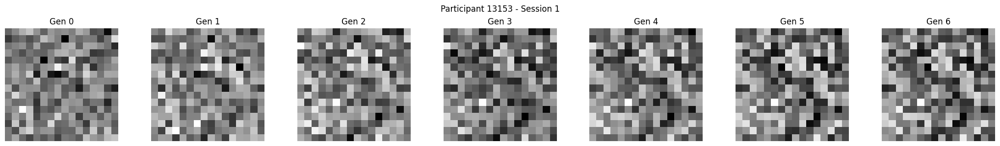

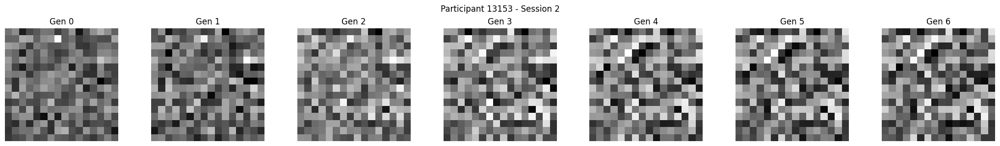

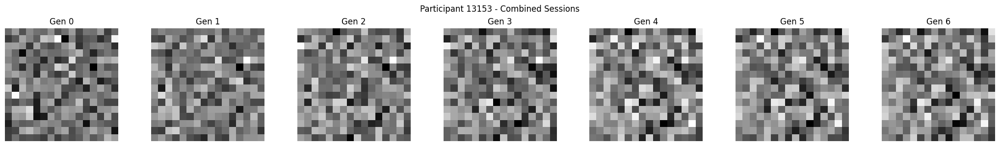


Participant 11935 (VVIQ Score: 2.74)


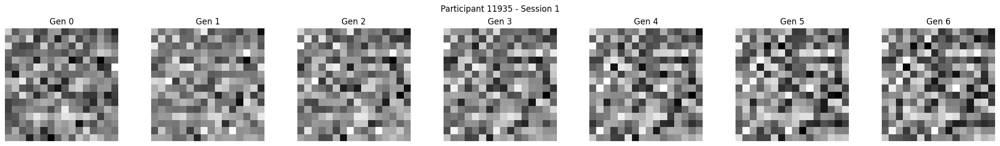

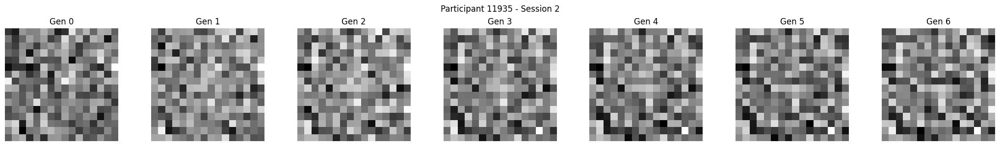

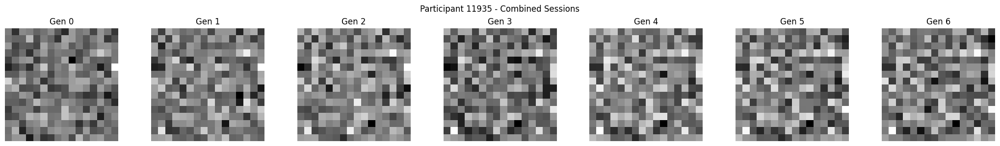


Participant 12082 (VVIQ Score: 2.06)


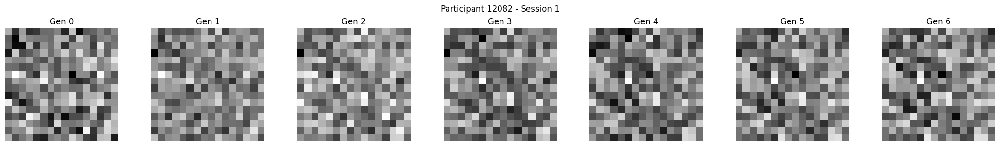

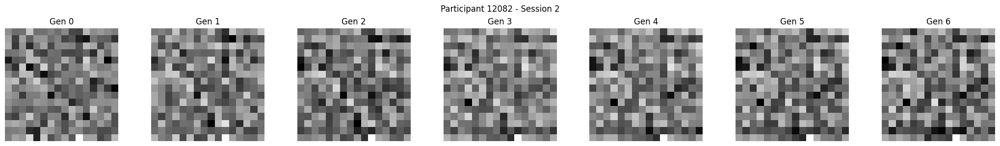

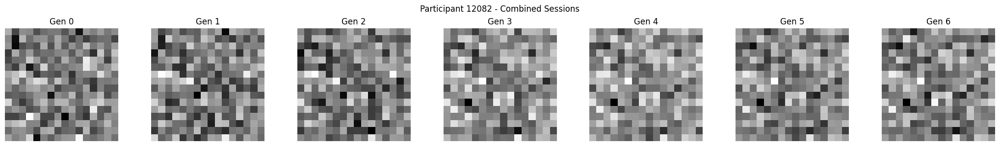


Participant 12055 (VVIQ Score: 2.68)


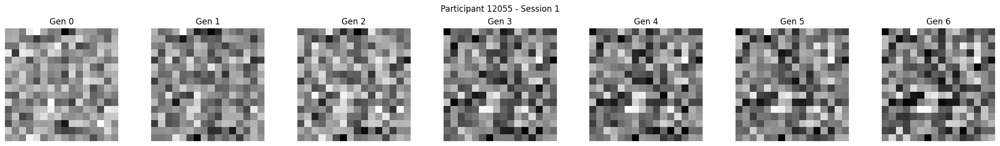

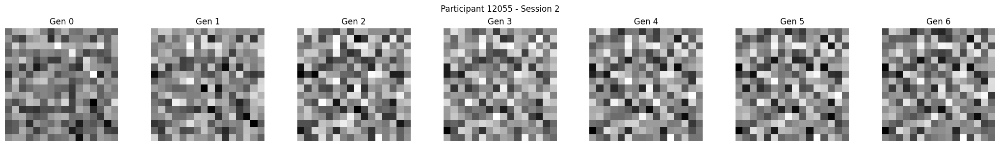

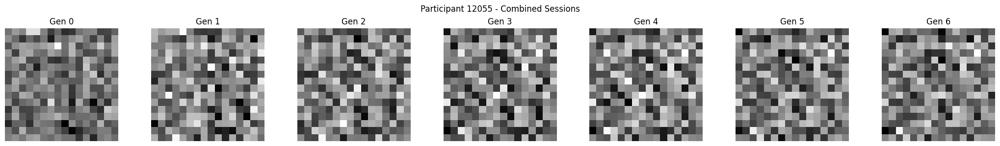


Participant 12601 (VVIQ Score: 2.71)


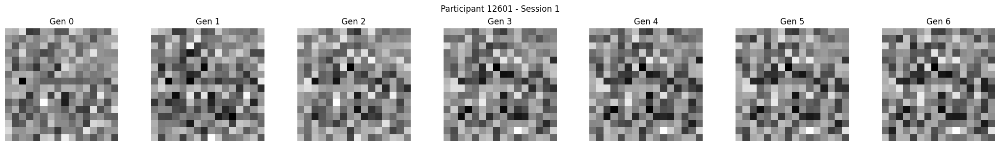

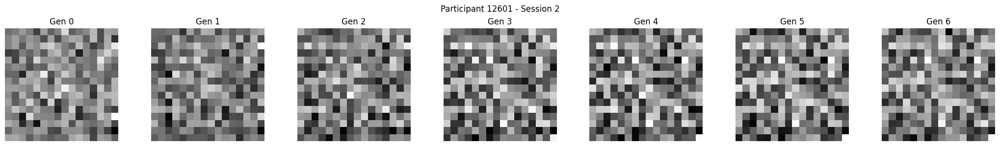

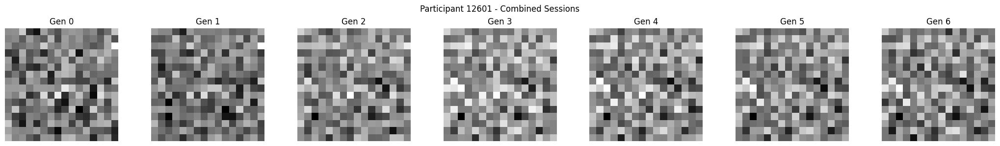


Participant 14755 (VVIQ Score: 2.15)


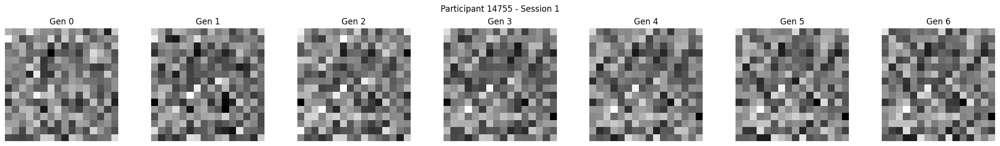

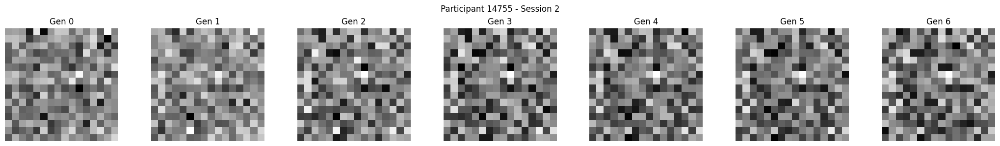

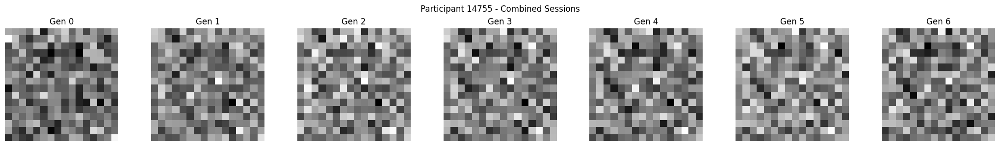


Participant 13465 (VVIQ Score: 2.41)


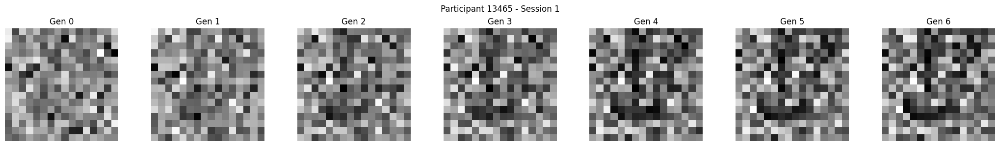

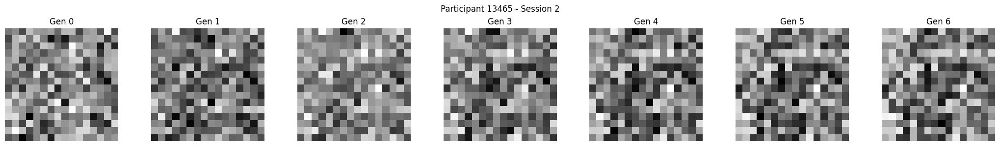

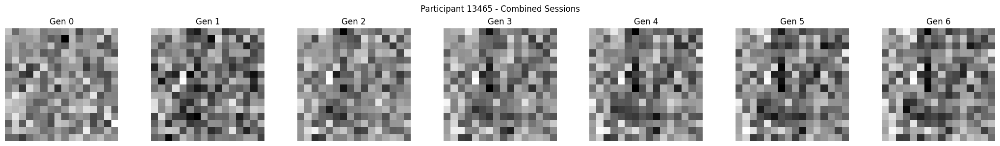


Participant 14413 (VVIQ Score: 2.68)


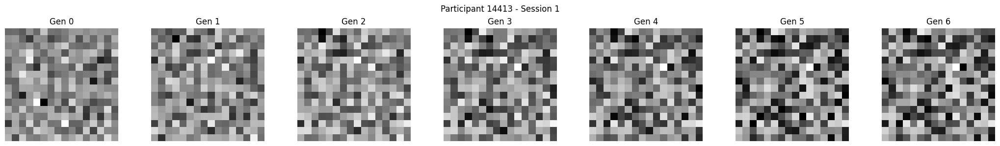

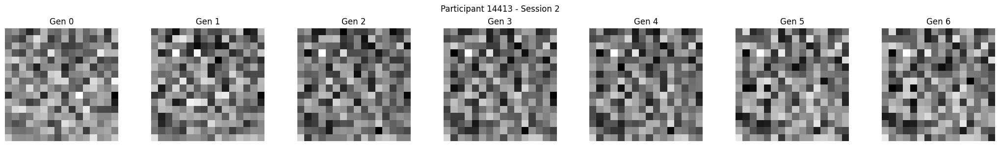

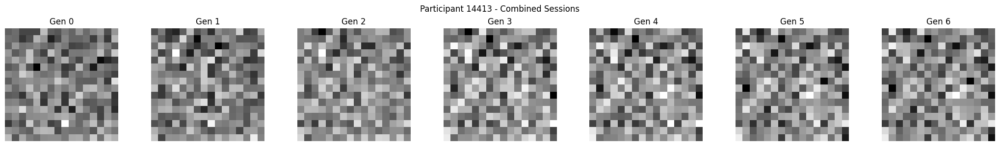


Participant 13597 (VVIQ Score: 2.09)


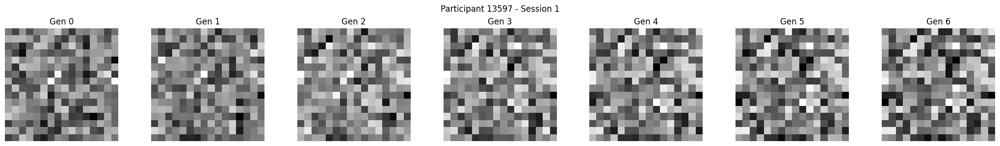

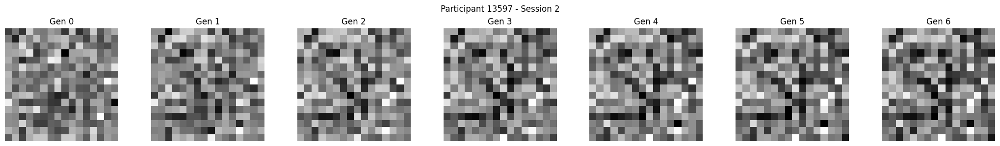

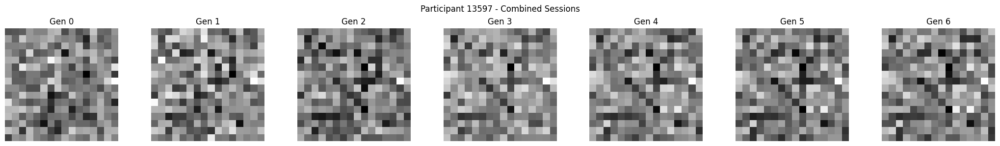


Participant 12727 (VVIQ Score: 2.53)


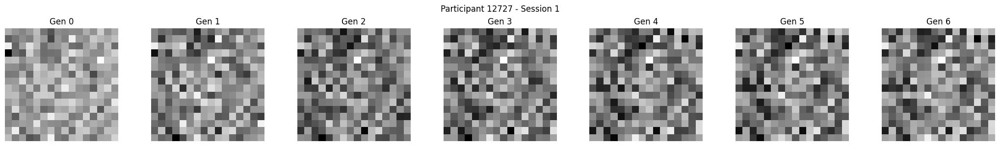

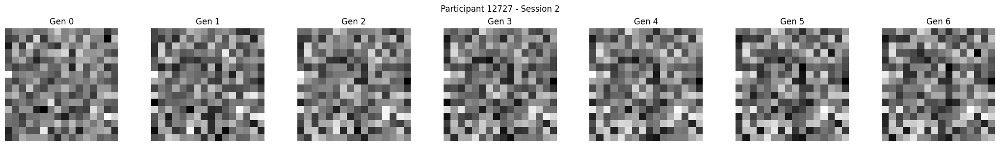

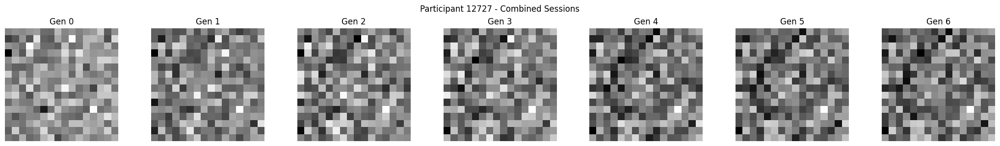


Participant 12031 (VVIQ Score: 2.62)


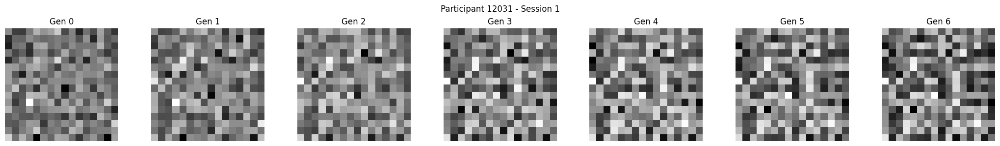

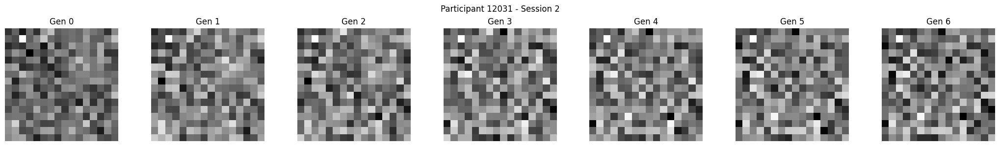

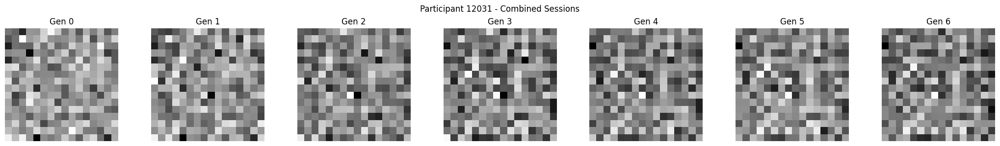


Participant 12298 (VVIQ Score: 2.50)


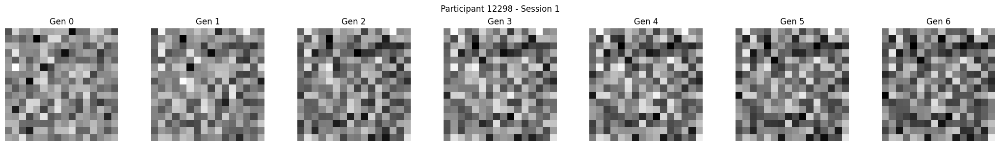

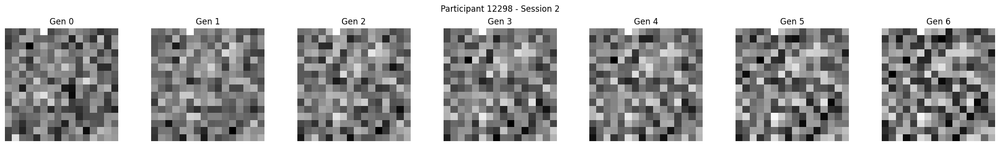

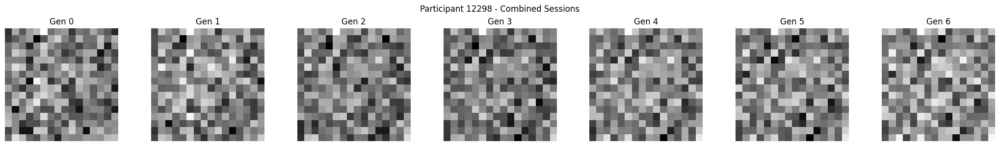


Participant 12286 (VVIQ Score: 2.29)


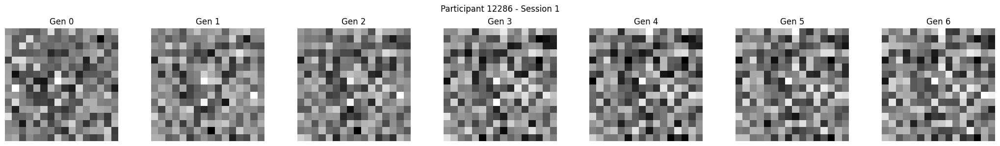

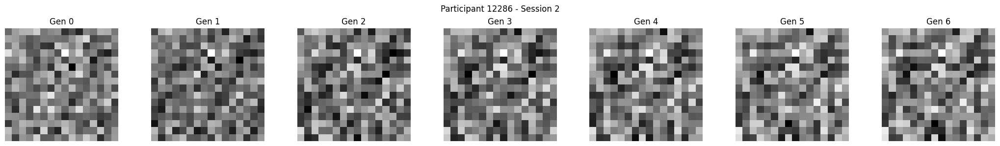

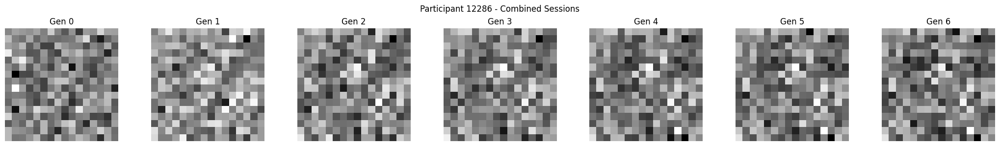


Participant 12451 (VVIQ Score: 2.00)


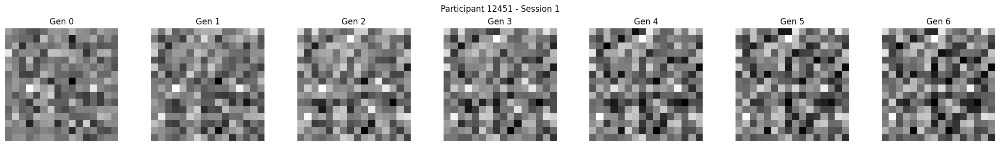

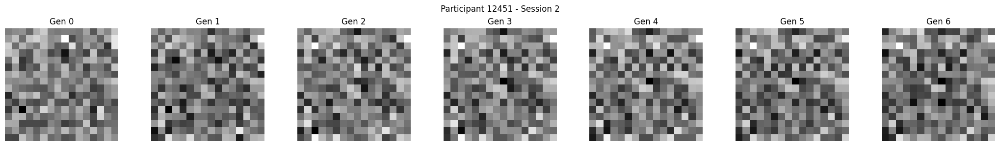

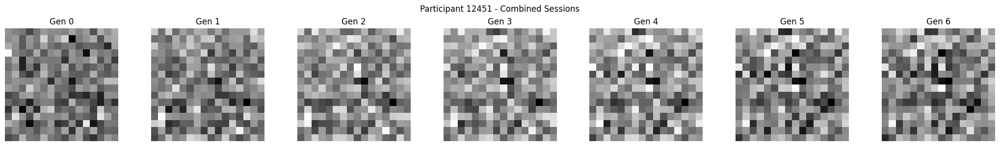


Participant 11932 (VVIQ Score: 2.59)


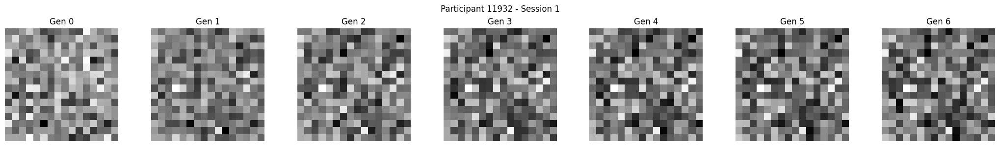

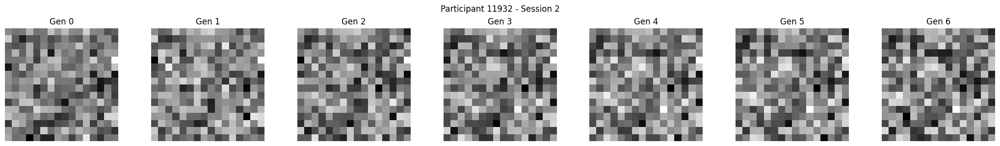

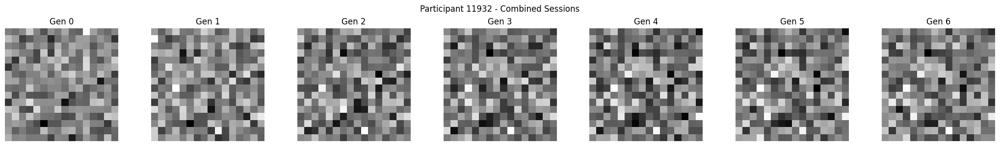


Participant 15052 (VVIQ Score: 2.21)


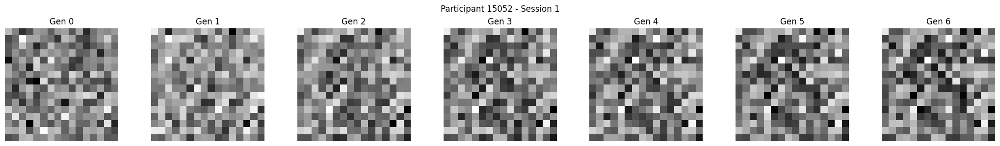

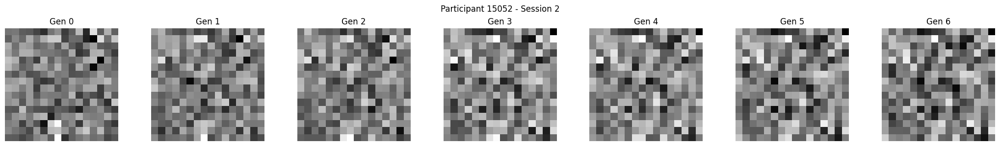

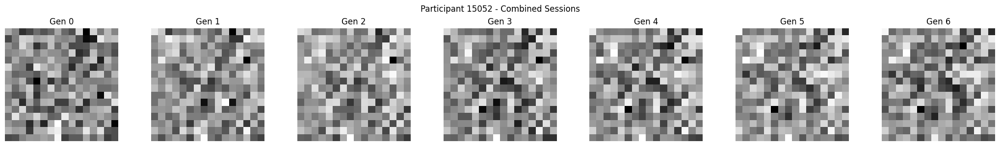


Participant 13102 (VVIQ Score: 2.91)


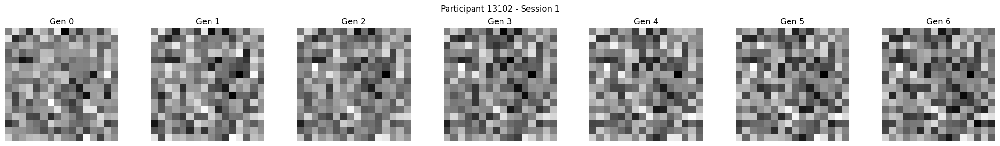

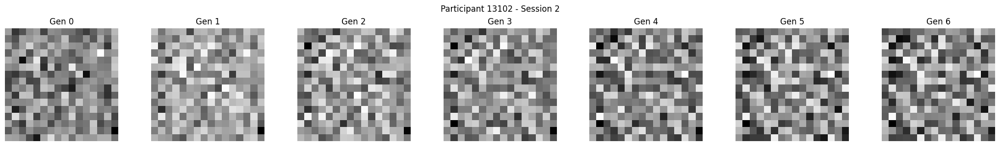

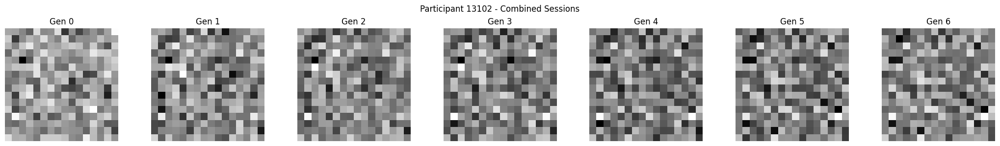


Participant 12322 (VVIQ Score: 2.09)


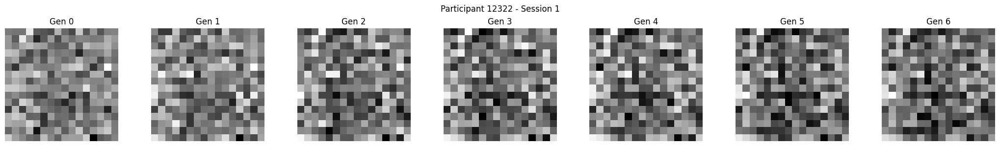

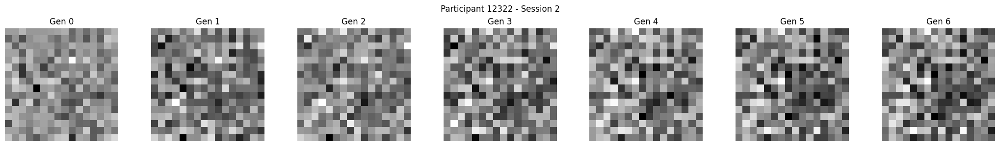

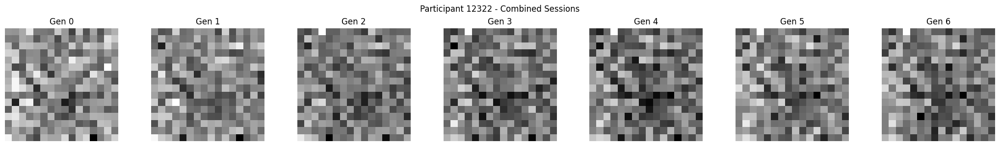


Participant 13648 (VVIQ Score: 2.50)


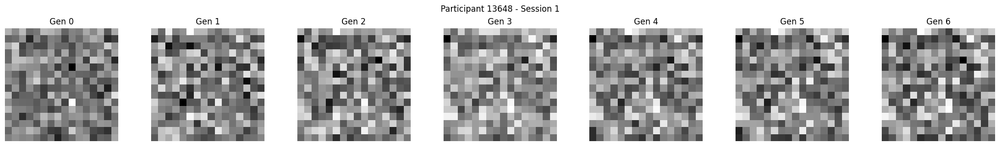

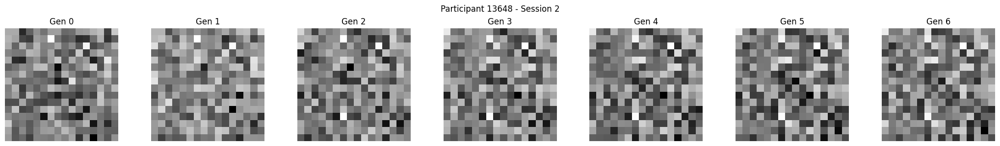

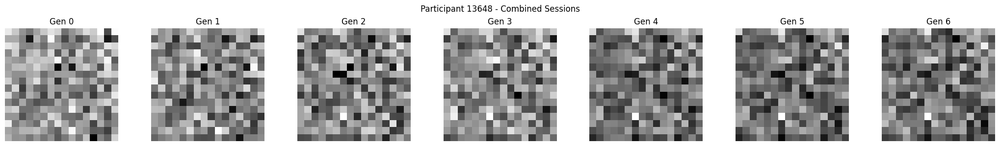


Participant 13816 (VVIQ Score: 2.88)


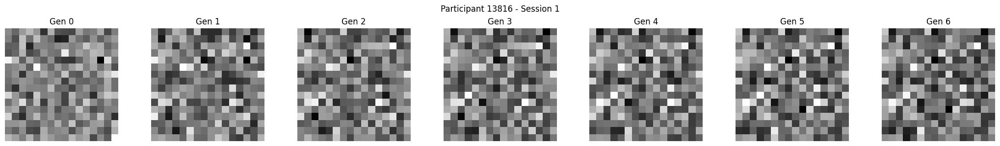

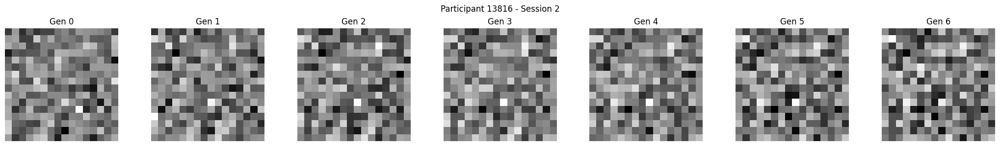

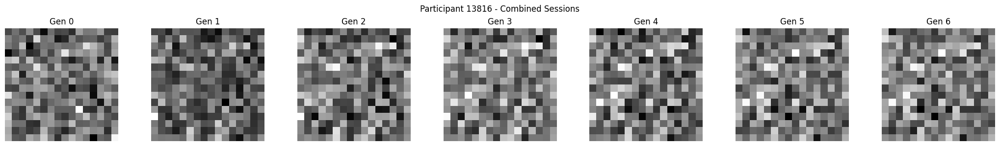


Participant 14554 (VVIQ Score: 2.56)


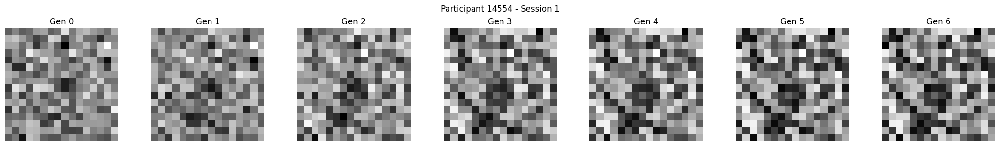

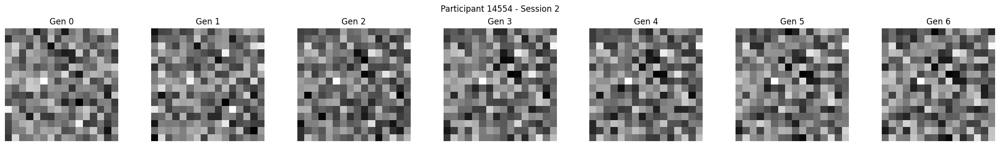

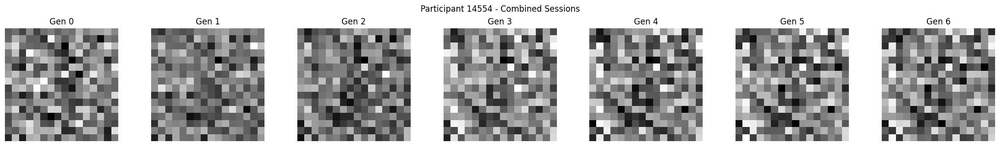


Participant 11914 (VVIQ Score: 2.59)


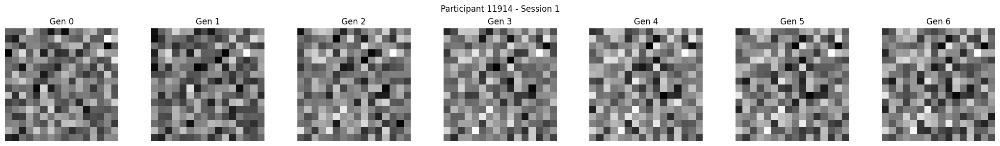

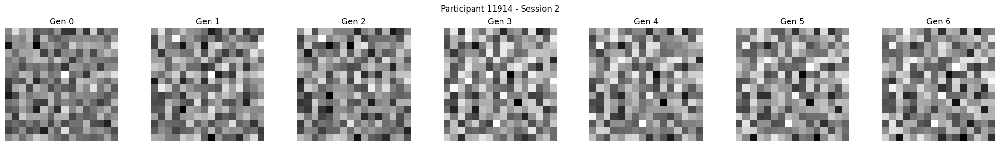

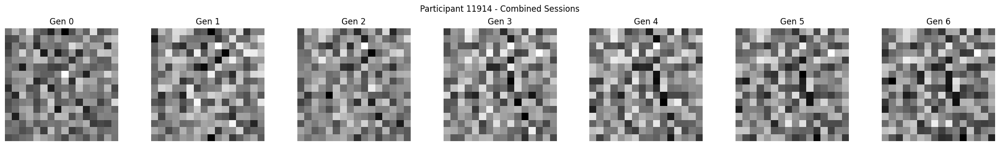


Participant 12391 (VVIQ Score: 2.53)


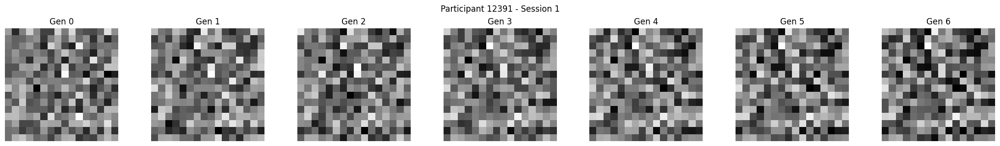

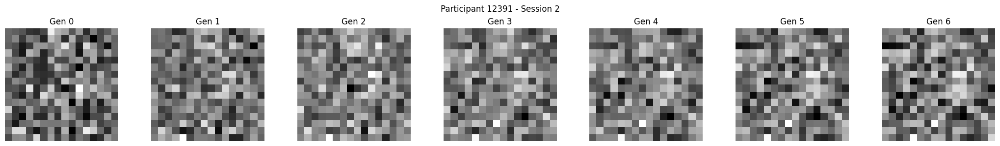

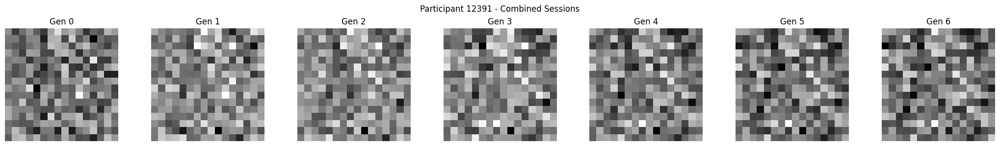


Participant 13246 (VVIQ Score: 2.47)


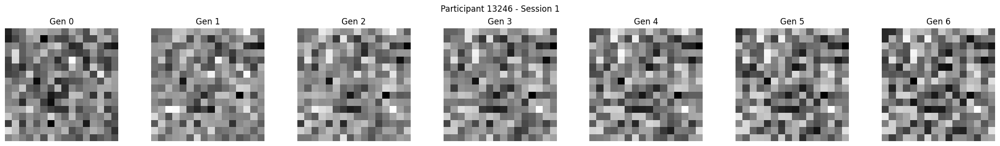

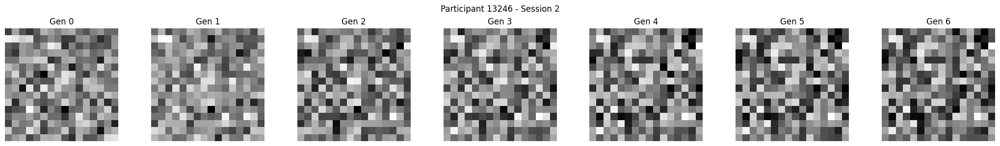

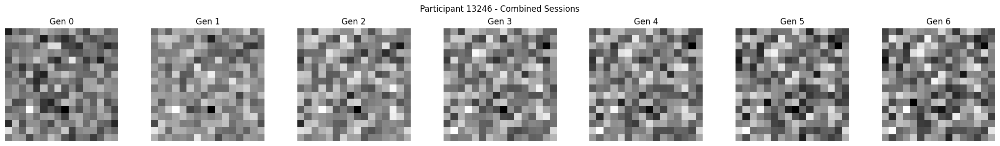


Participant 11983 (VVIQ Score: 2.15)


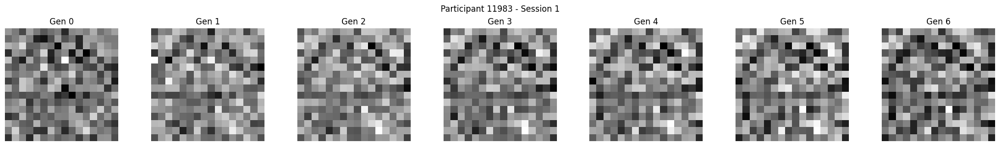

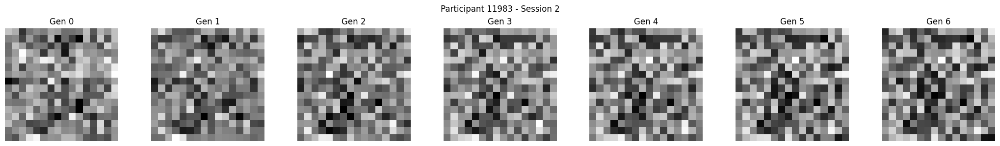

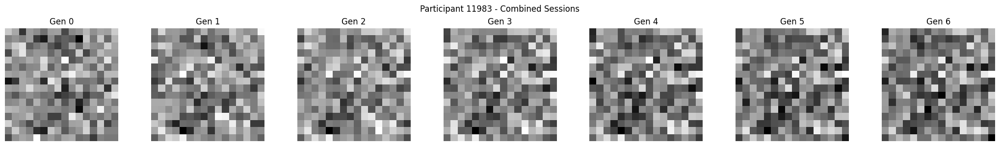


Participant 12070 (VVIQ Score: 2.24)


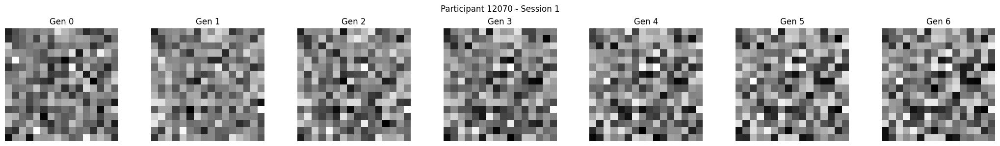

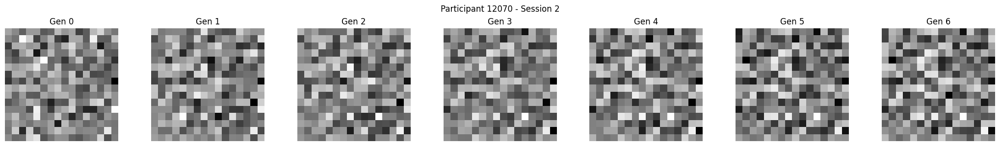

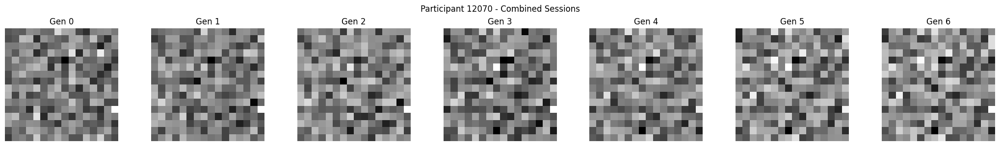


Classification Images for Group: low_vivid
Number of participants: 18

Participant 4737 (VVIQ Score: 3.03)


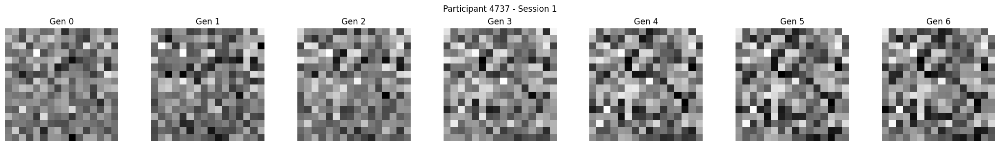

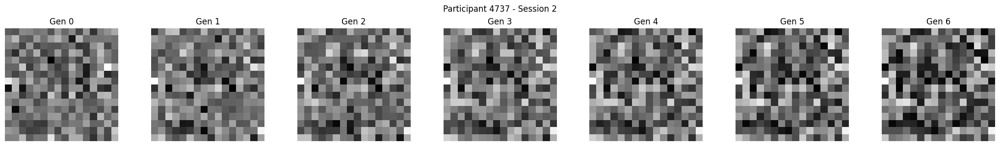

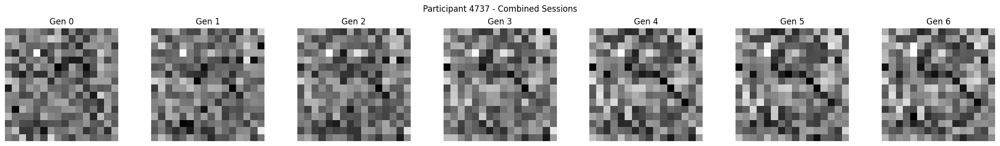


Participant 12346 (VVIQ Score: 3.00)


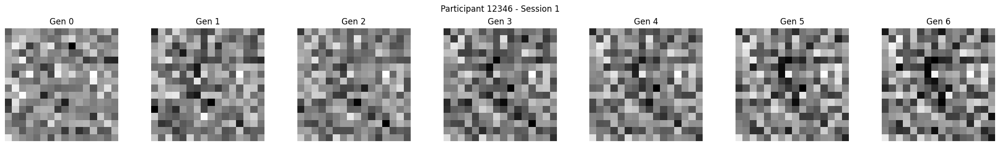

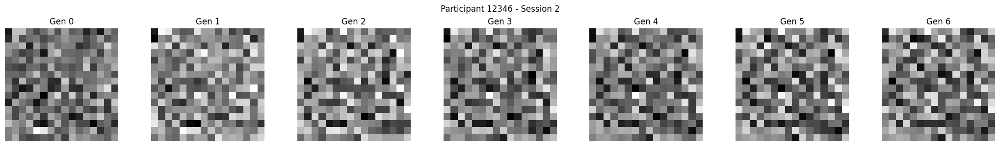

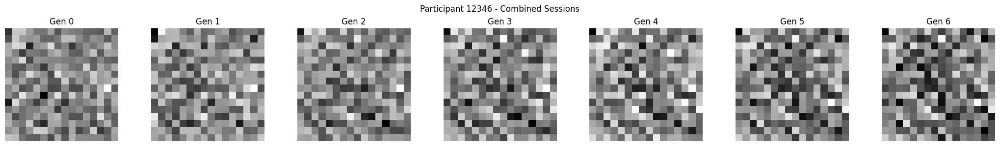


Participant 11929 (VVIQ Score: 3.35)


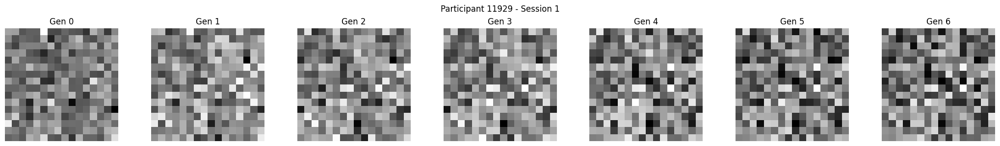

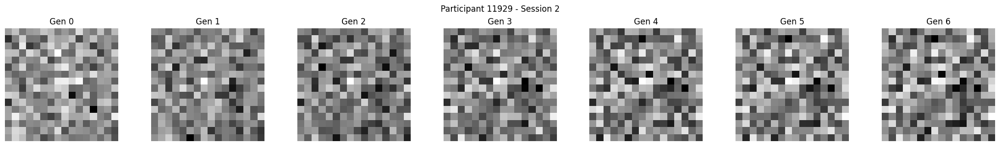

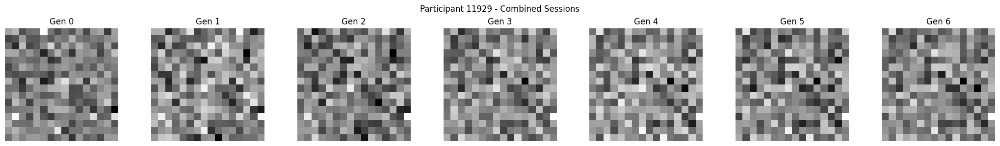


Participant -1 (VVIQ Score: 4.71)


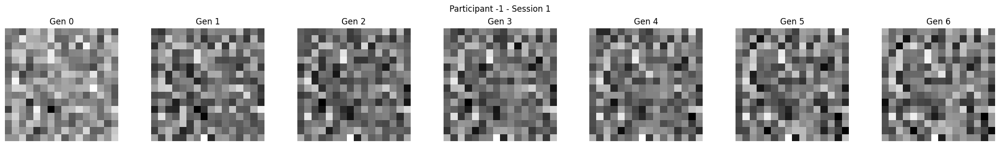

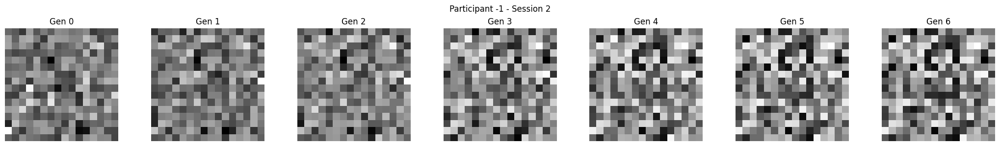

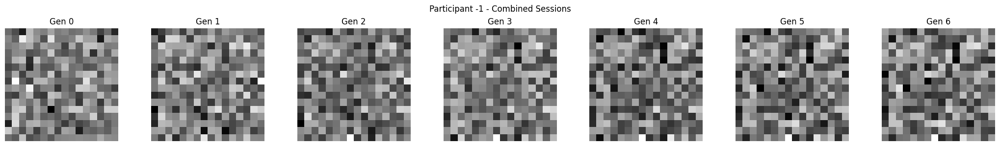


Participant 12301 (VVIQ Score: 3.21)


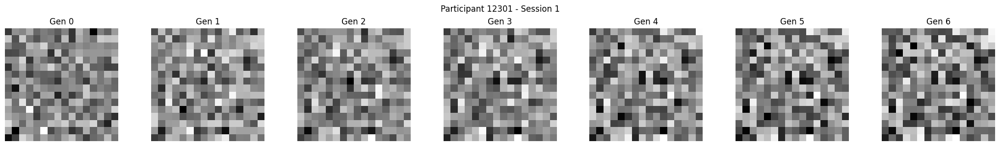

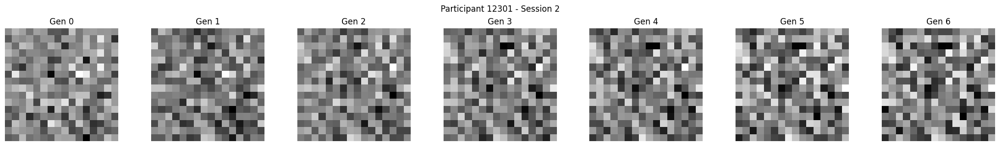

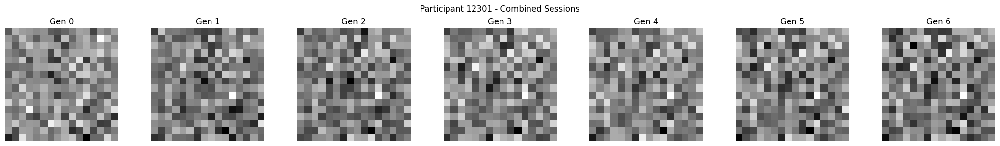


Participant 13204 (VVIQ Score: 4.29)


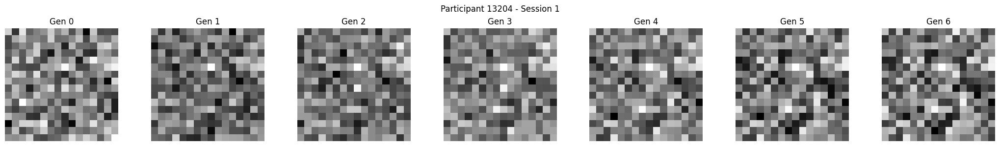

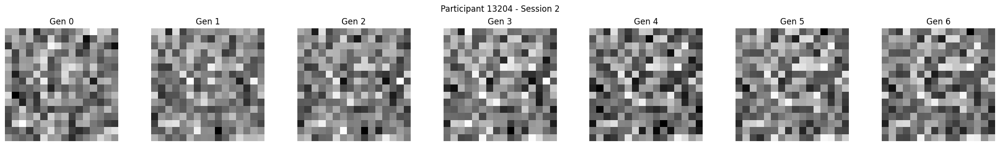

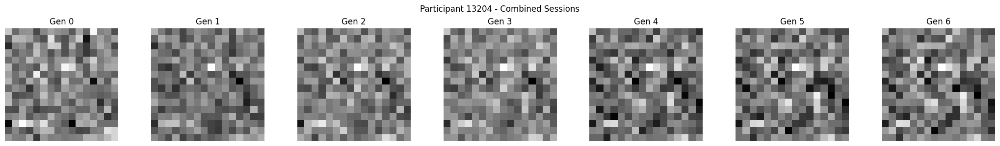


Participant 14215 (VVIQ Score: 3.03)


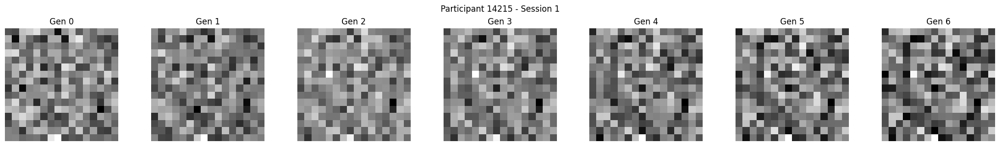

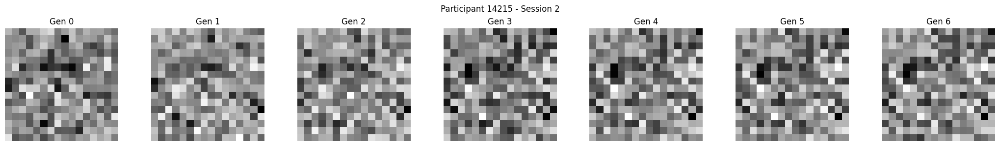

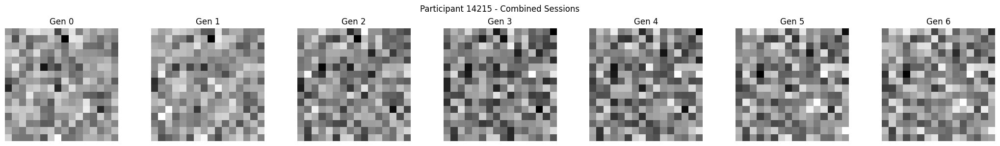


Participant 12682 (VVIQ Score: 3.21)


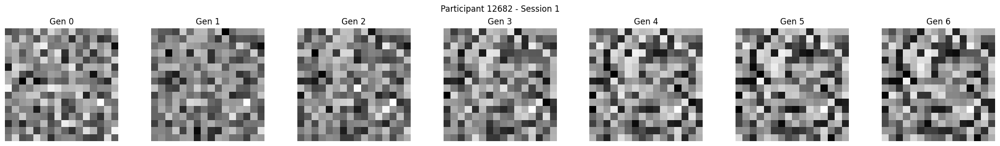

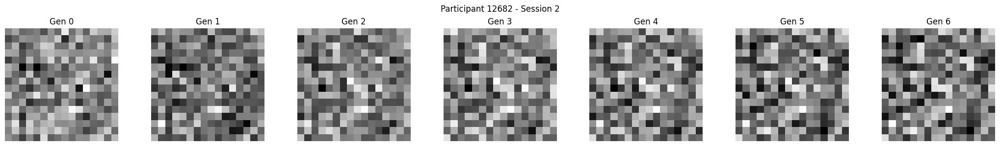

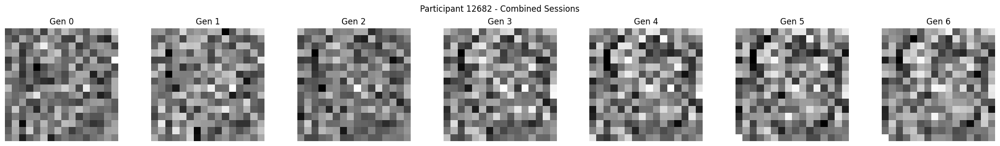


Participant 13075 (VVIQ Score: 4.03)


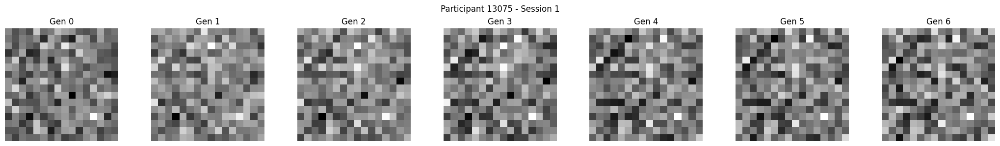

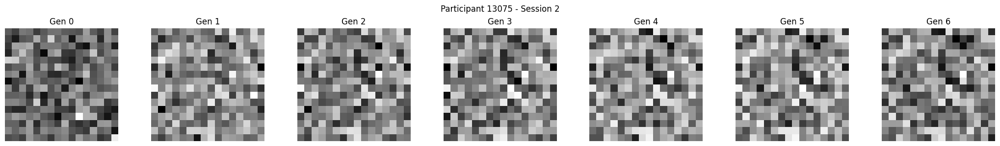

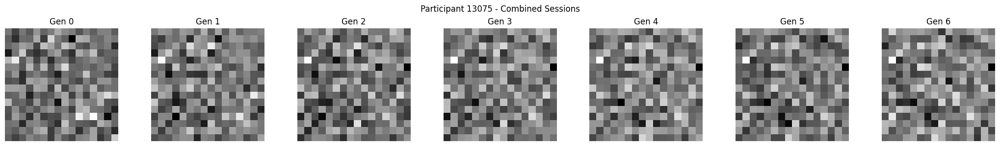


Participant 12700 (VVIQ Score: 3.47)


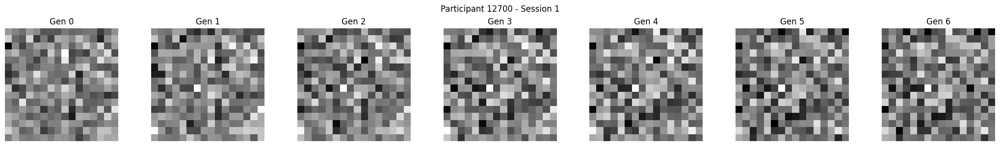

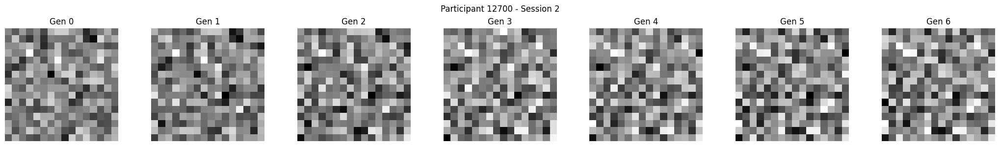

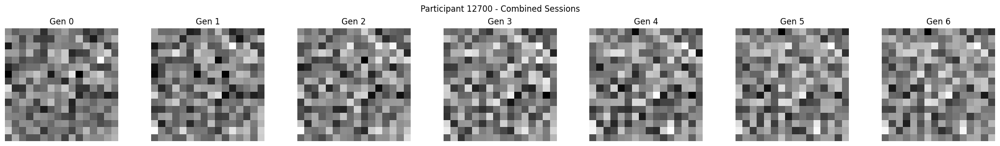


Participant 12028 (VVIQ Score: 3.15)


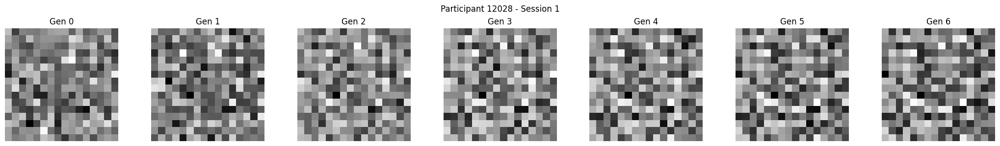

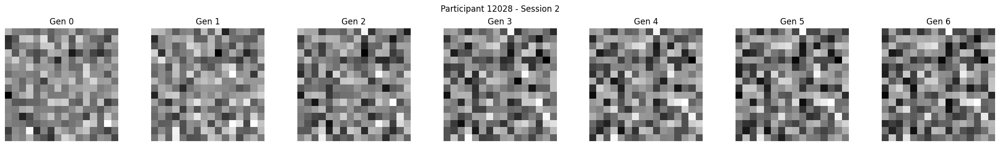

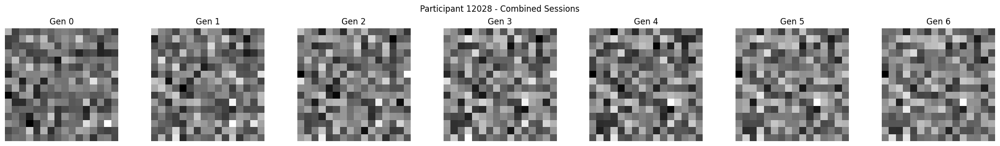


Participant 12262 (VVIQ Score: 4.00)


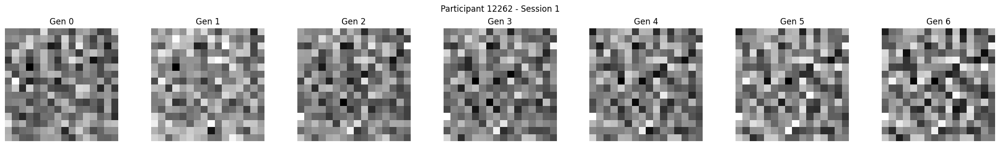

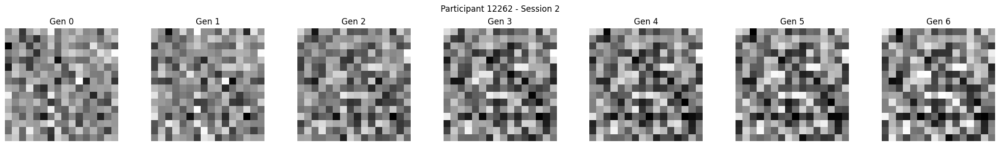

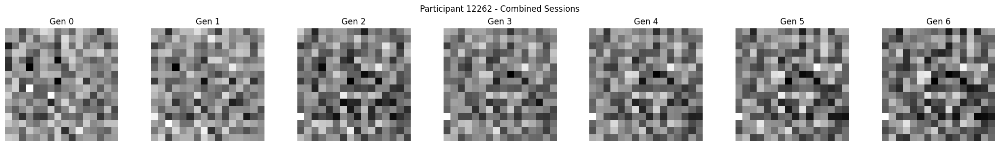


Participant 12172 (VVIQ Score: 5.00)


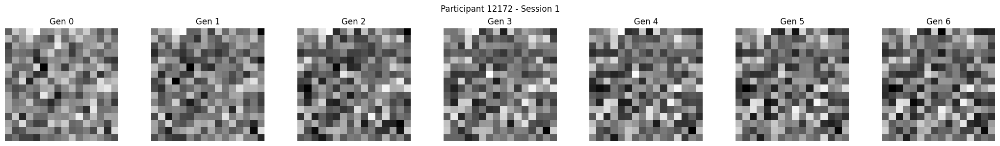

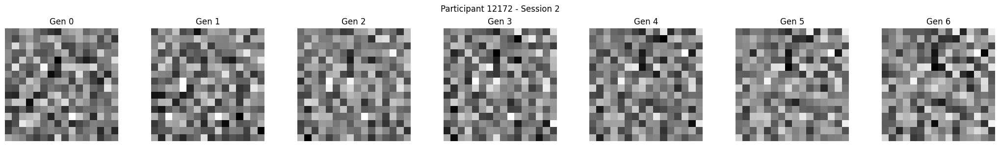

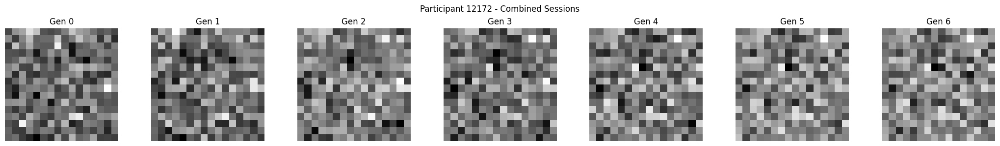


Participant 13336 (VVIQ Score: 3.56)


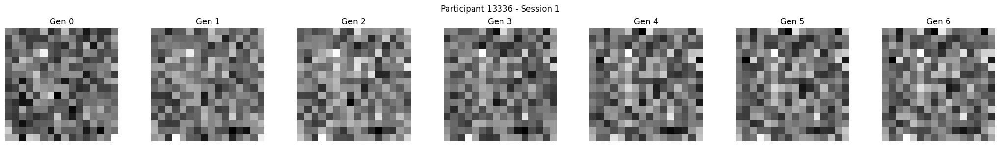

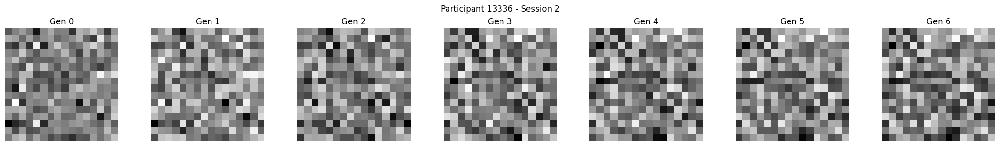

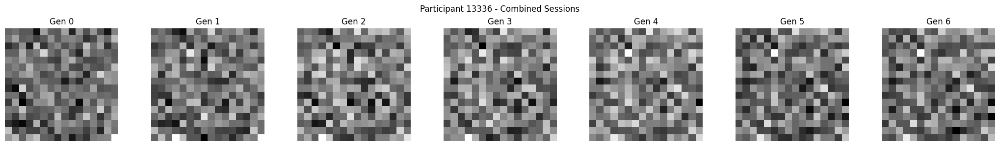


Participant 12598 (VVIQ Score: 4.12)


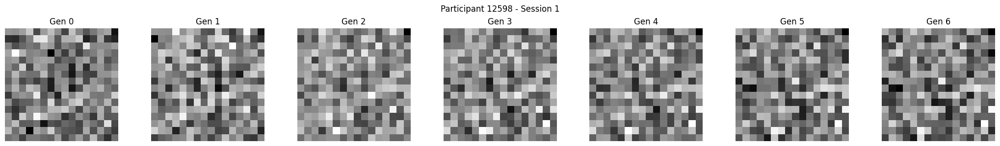

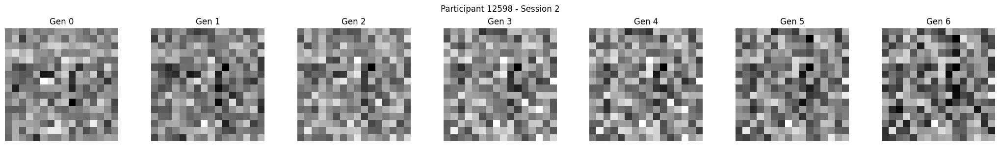

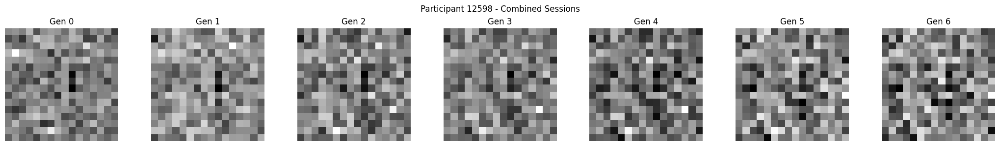


Participant 12427 (VVIQ Score: 3.85)


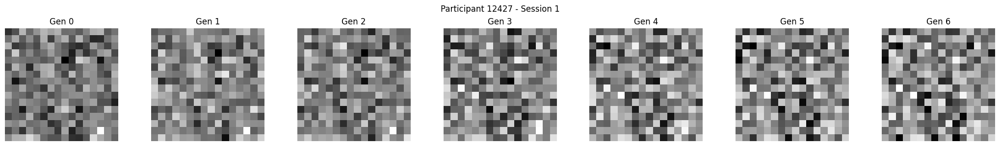

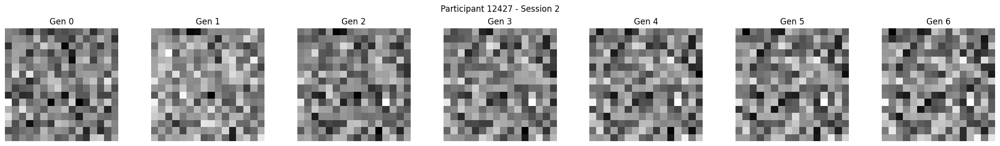

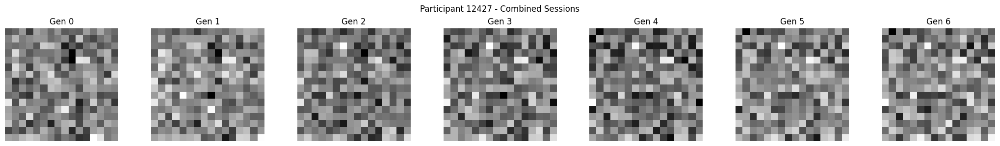


Participant 12205 (VVIQ Score: 3.12)


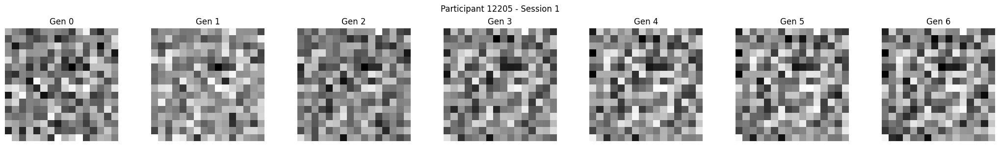

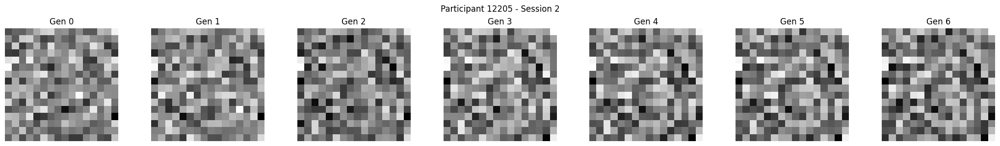

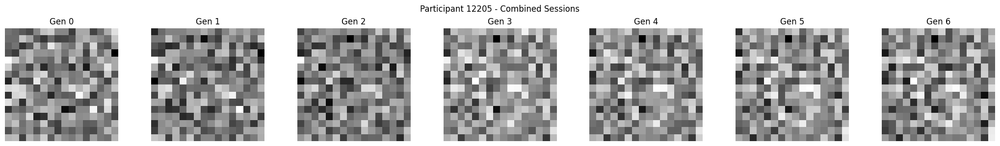


Participant 12475 (VVIQ Score: 3.44)


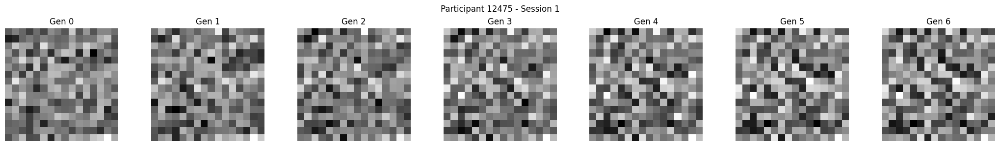

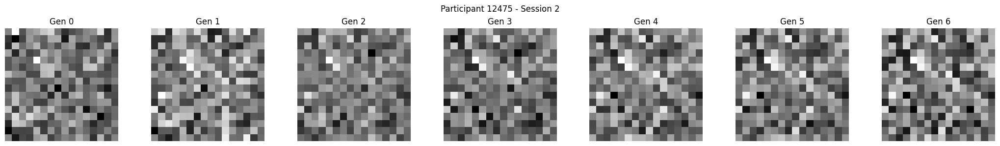

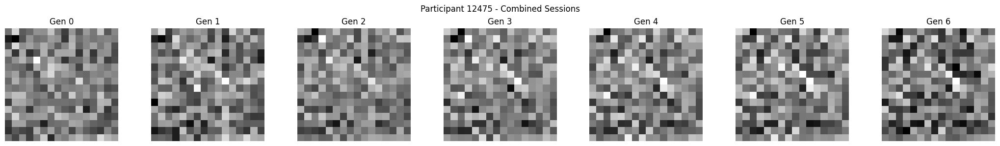

In [20]:
def visualize_classification_by_vviq(valid_results, clean_dfs, vviq_summary):
    # Define VVIQ groups
    def get_vviq_group(score):
        if score < 2.0:
            return 'high_vivid'  # Lower scores = more vivid
        elif score < 3.0:
            return 'medium_vivid'
        else:
            return 'low_vivid'  # Higher scores = less vivid
    
    # Add VVIQ group to summary
    vviq_groups = {
        pid: get_vviq_group(score) 
        for pid, score in vviq_summary['total_mean'].items()
    }
    
    # Process evolution data by VVIQ group
    grouped_results = {
        'high_vivid': {},
        'medium_vivid': {},
        'low_vivid': {}
    }
    
    # Organize data by VVIQ groups
    clean_participant_data = process_evolution_data(valid_results, clean_dfs)
    for participant_id, data in clean_participant_data.items():
        if participant_id in vviq_groups:
            group = vviq_groups[participant_id]
            grouped_results[group][participant_id] = data
    
    # Visualize each group
    for group, participants in grouped_results.items():
        if participants:
            print(f"\nClassification Images for Group: {group}")
            print(f"Number of participants: {len(participants)}")
            
            for participant_id, data in participants.items():
                print(f"\nParticipant {participant_id} (VVIQ Score: {vviq_summary.loc[participant_id, 'total_mean']:.2f})")
                plot_participant_sessions_with_combined(data, participant_id)

# Run the visualization
visualize_classification_by_vviq(valid_results, clean_dfs, vviq_summary)

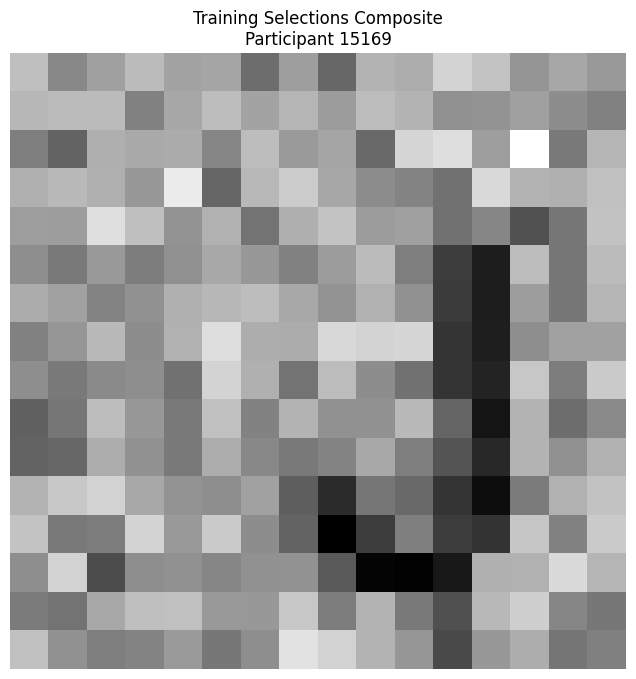

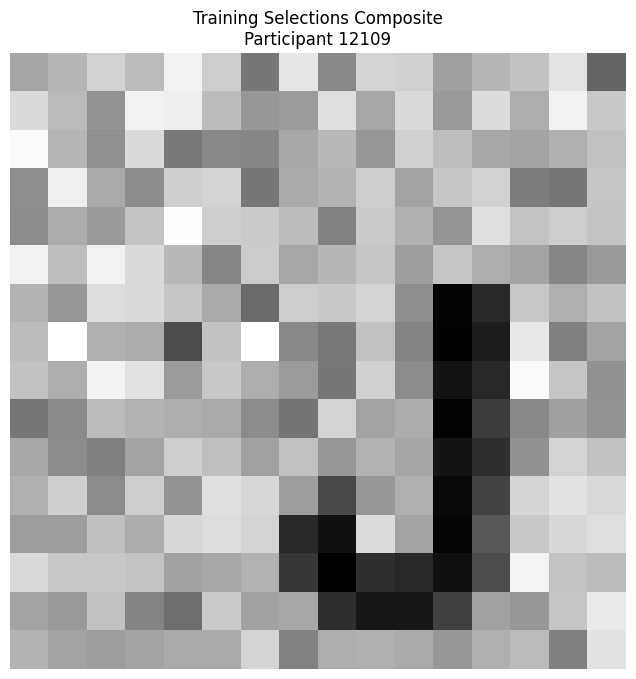

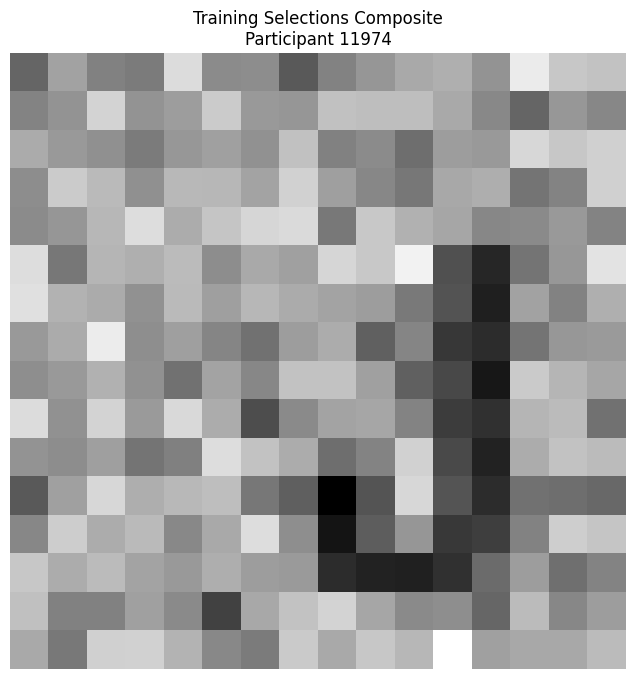

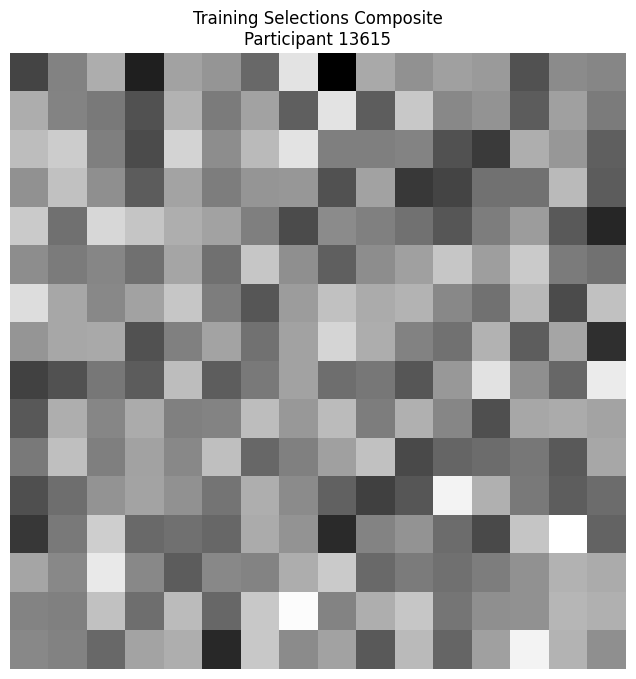

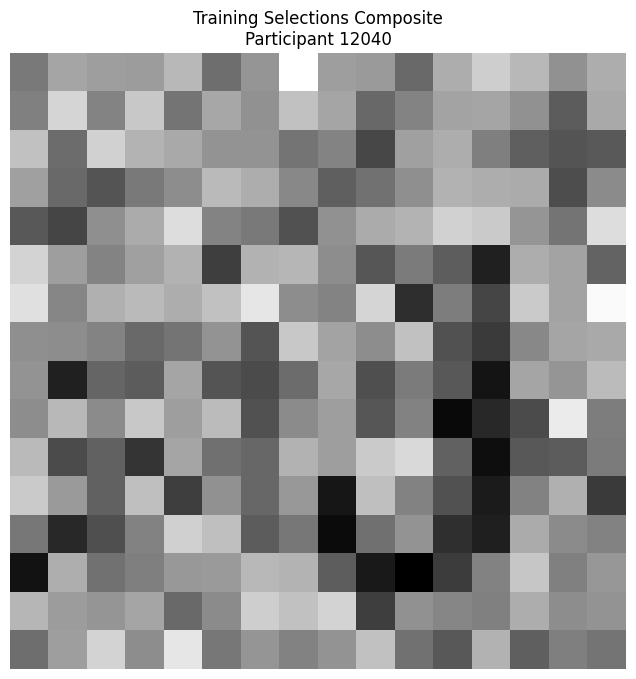

...

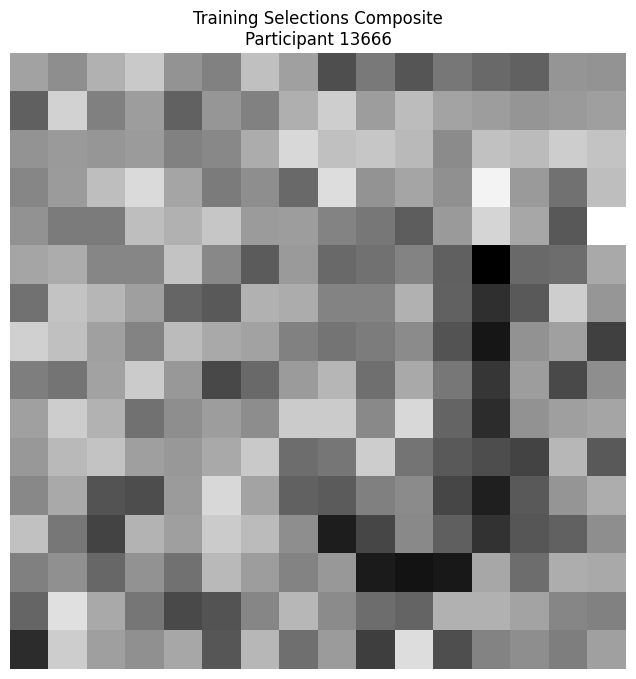

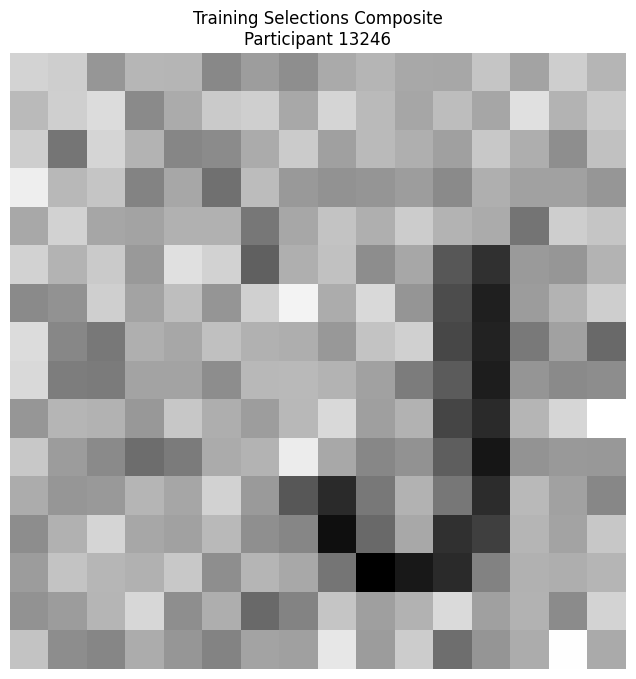

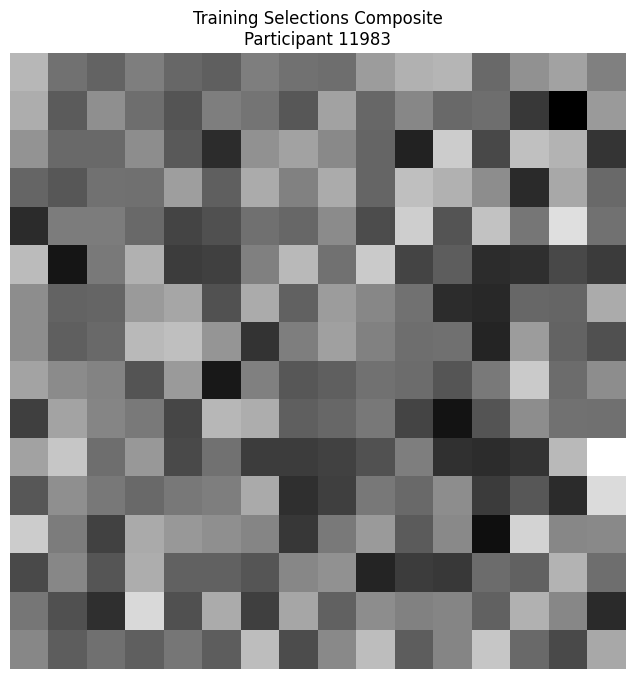

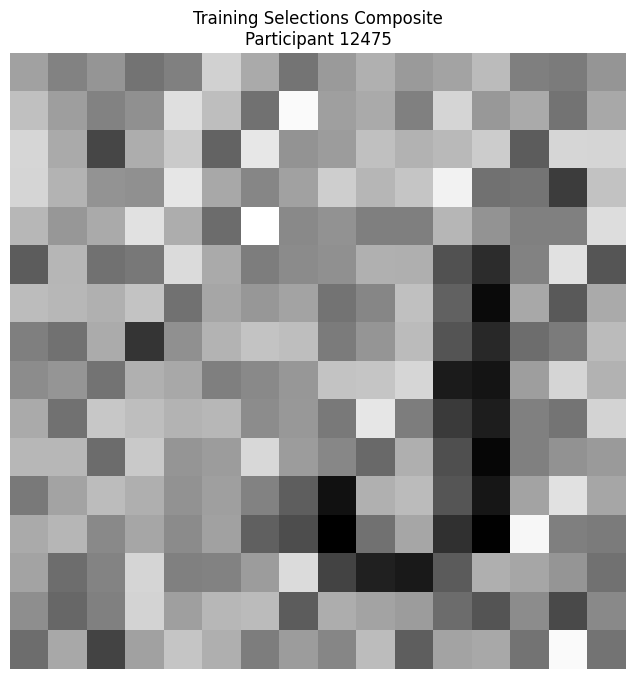

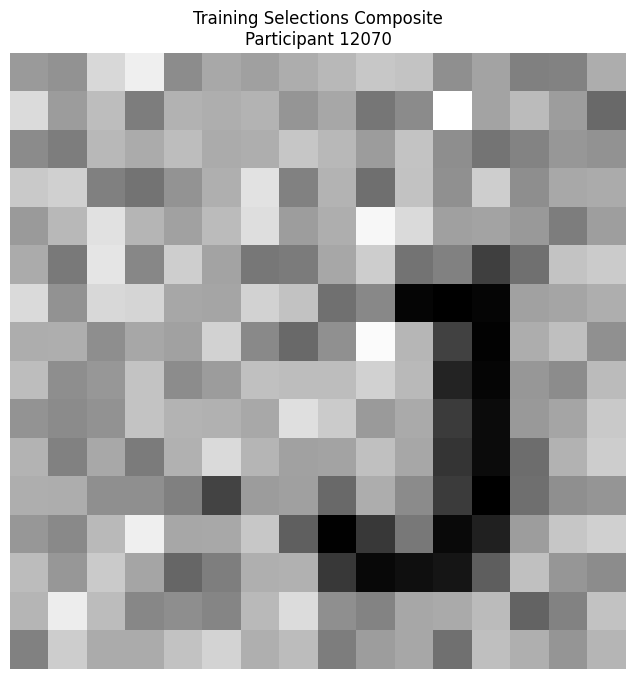

In [21]:
def visualize_training_selections(valid_results, clean_dfs):
    """Visualize training phase selections for each participant"""
    def extract_training_data(result):
        if 'training_phase' in result and 'trials' in result['training_phase']:
            return {
                'participant_id': result['metadata']['participant_id'],
                'trials': result['training_phase']['trials'],
                'selected_images': [trial['selected_image'] for trial in result['training_phase']['trials'] 
                                  if 'selected_image' in trial]
            }
        return None

    # Process training data
    training_selections = {}
    for result in valid_results:
        training_data = extract_training_data(result)
        if training_data and training_data['participant_id'] in clean_dfs['participants'].index:
            training_selections[training_data['participant_id']] = training_data['selected_images']

    # Visualize selections for each participant
    for participant_id, selections in training_selections.items():
        if selections:
            # Create composite of all selections
            selected_images = []
            for img_base64 in selections:
                try:
                    img = decode_base64_image(img_base64)
                    selected_images.append(img)
                except:
                    continue

            if selected_images:
                plt.figure(figsize=(8, 8))
                composite = create_composite_image(selected_images)
                plt.imshow(composite, cmap='gray')
                plt.axis('off')
                plt.title(f'Training Selections Composite\nParticipant {participant_id}')
                plt.show()
                plt.close()

# Run the visualization
visualize_training_selections(valid_results, clean_dfs)

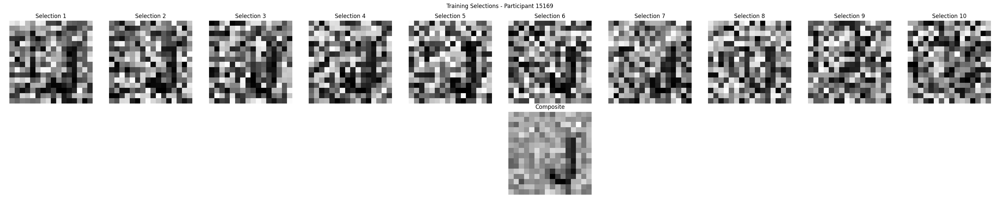

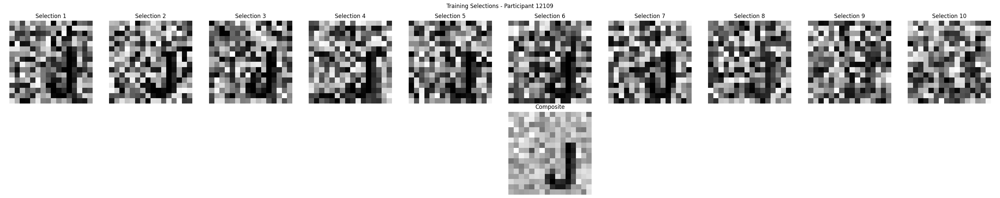

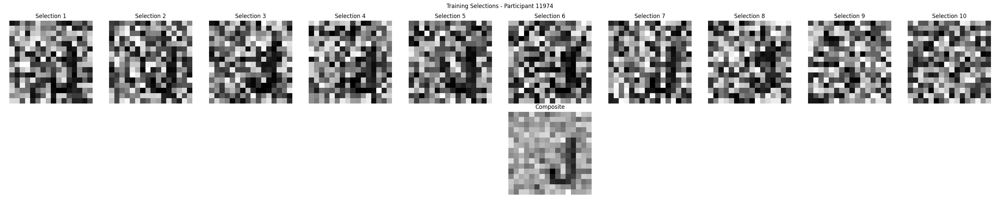

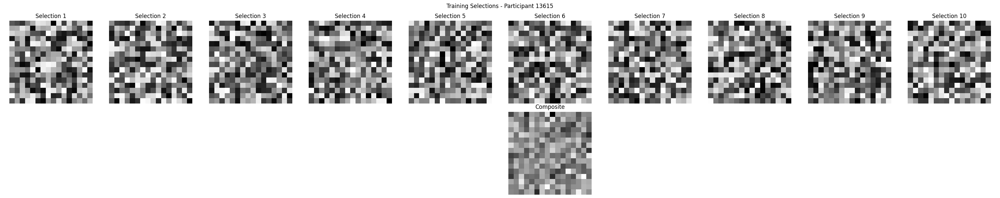

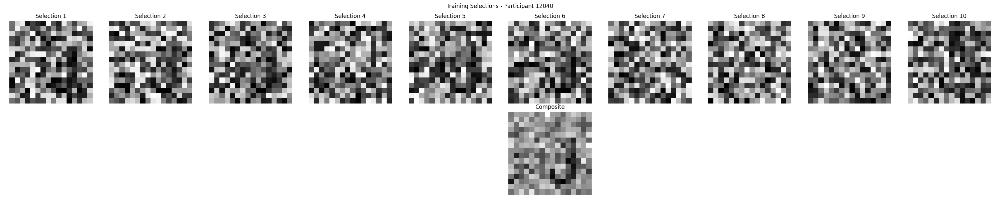

...

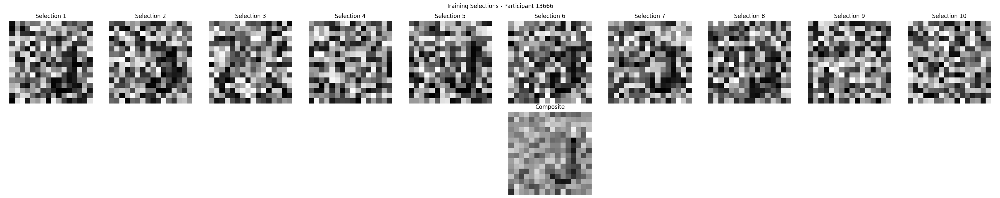

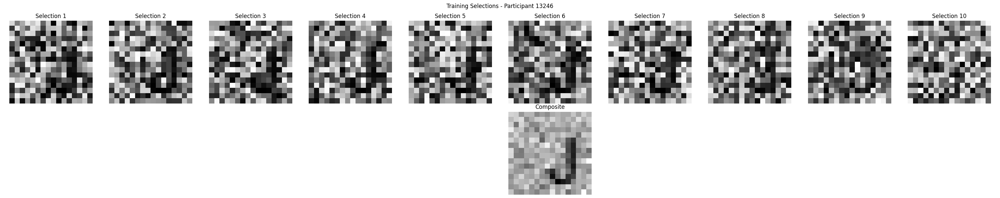

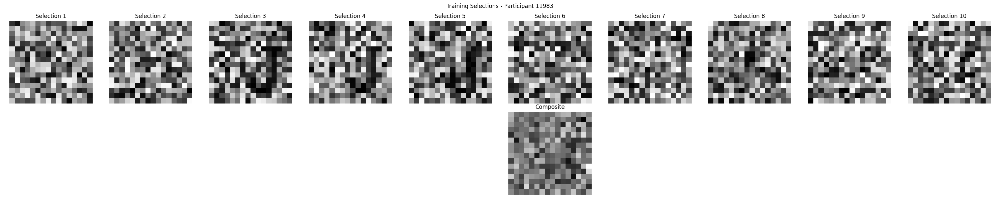

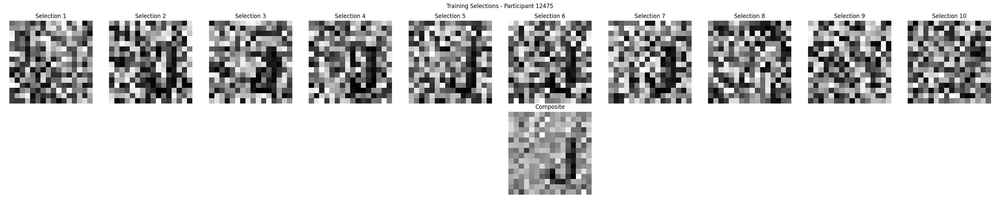

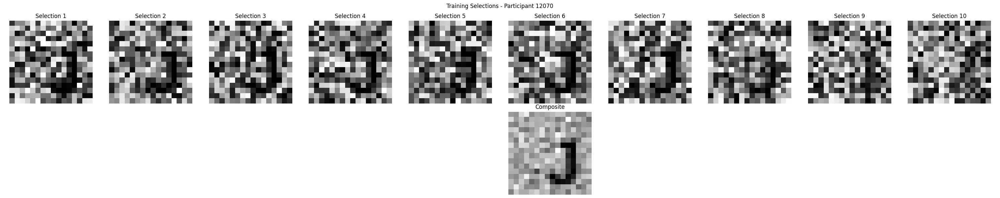

In [22]:
def visualize_training_selections_detailed(valid_results, clean_dfs):
    """Visualize both individual and composite training selections"""
    def extract_training_data(result):
        if 'training_phase' in result and 'trials' in result['training_phase']:
            return {
                'participant_id': result['metadata']['participant_id'],
                'trials': result['training_phase']['trials'],
                'selected_images': [trial['selected_image'] for trial in result['training_phase']['trials'] 
                                  if 'selected_image' in trial]
            }
        return None

    # Process training data
    training_selections = {}
    for result in valid_results:
        training_data = extract_training_data(result)
        if training_data and training_data['participant_id'] in clean_dfs['participants'].index:
            training_selections[training_data['participant_id']] = training_data['selected_images']

    # Visualize selections for each participant
    for participant_id, selections in training_selections.items():
        if selections:
            # Create figure for all selections and composite
            n_selections = len(selections)
            fig, axes = plt.subplots(2, max(n_selections, 1), 
                                   figsize=(3*max(n_selections, 1), 6))
            
            # Plot individual selections
            for idx, img_base64 in enumerate(selections):
                try:
                    img = decode_base64_image(img_base64)
                    axes[0, idx].imshow(img.convert('L'), cmap='gray')
                    axes[0, idx].axis('off')
                    axes[0, idx].set_title(f'Selection {idx+1}')
                except:
                    continue
            
            # Create and plot composite
            selected_images = []
            for img_base64 in selections:
                try:
                    img = decode_base64_image(img_base64)
                    selected_images.append(img)
                except:
                    continue

            if selected_images:
                composite = create_composite_image(selected_images)
                for ax in axes[1]:
                    ax.axis('off')
                axes[1, n_selections//2].imshow(composite, cmap='gray')
                axes[1, n_selections//2].set_title('Composite')

            plt.suptitle(f'Training Selections - Participant {participant_id}')
            plt.tight_layout()
            plt.show()
            plt.close()

# Run the visualization
visualize_training_selections_detailed(valid_results, clean_dfs)

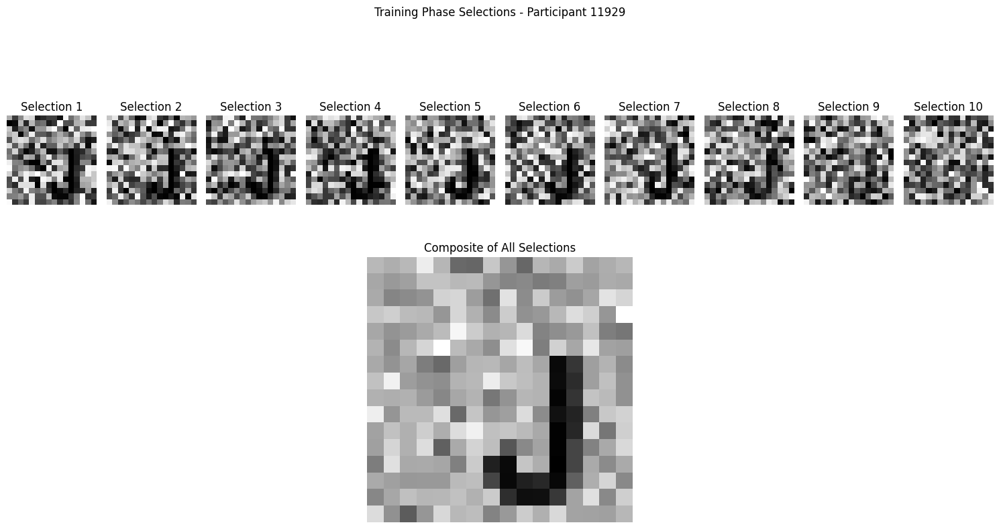

In [23]:
def visualize_training_selections_simple(valid_results, participant_id):
    # Extract training data for the participant
    def extract_training_data(result):
        if ('training_phase' in result and 
            'trials' in result['training_phase'] and 
            result['metadata']['participant_id'] == participant_id):
            return [trial['selected_image'] for trial in result['training_phase']['trials'] 
                   if 'selected_image' in trial]
        return []

    # Get selections
    selections = []
    for result in valid_results:
        selections.extend(extract_training_data(result))
    
    if selections:
        # Create a single figure
        n_selections = len(selections)
        fig = plt.figure(figsize=(15, 8))
        
        # Plot individual selections
        for idx, img_base64 in enumerate(selections):
            plt.subplot(2, n_selections, idx + 1)
            try:
                img = decode_base64_image(img_base64)
                plt.imshow(img.convert('L'), cmap='gray')
                plt.axis('off')
                plt.title(f'Selection {idx+1}')
            except Exception as e:
                print(f"Error processing image {idx}: {str(e)}")
                continue
        
        # Create and plot composite
        selected_images = []
        for img_base64 in selections:
            try:
                img = decode_base64_image(img_base64)
                selected_images.append(img)
            except:
                continue
                
        if selected_images:
            # Center the composite in bottom row
            composite = create_composite_image(selected_images)
            plt.subplot(2, 1, 2)
            plt.imshow(composite, cmap='gray')
            plt.axis('off')
            plt.title('Composite of All Selections')
        
        plt.suptitle(f'Training Phase Selections - Participant {participant_id}')
        plt.tight_layout()
        plt.show()

# Try the visualization
visualize_training_selections_simple(valid_results, '11929')

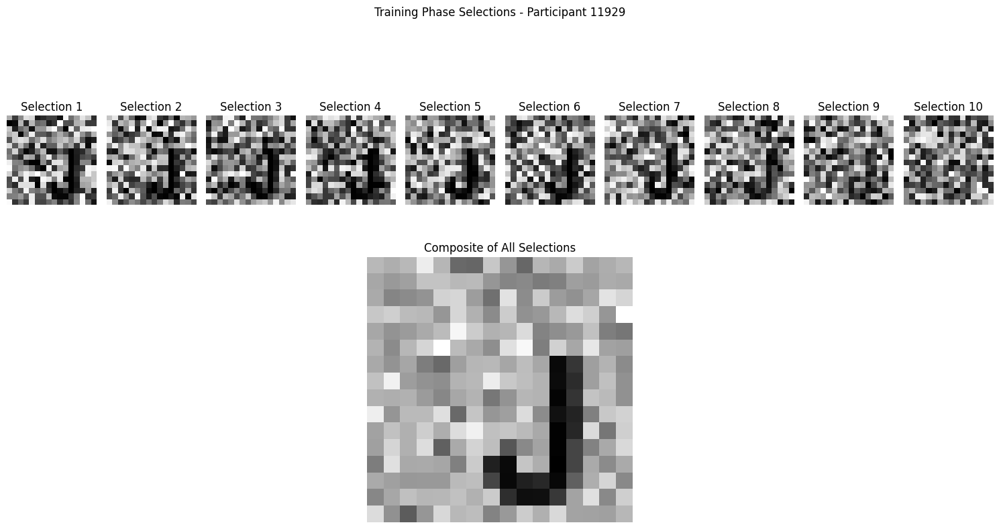

In [24]:
def create_compact_training_visualization(valid_results, participant_id):
    # Extract training data for the participant
    def extract_training_data(result):
        if ('training_phase' in result and 
            'trials' in result['training_phase'] and 
            result['metadata']['participant_id'] == participant_id):
            return [trial['selected_image'] for trial in result['training_phase']['trials'] 
                   if 'selected_image' in trial]
        return []

    # Get selections
    selections = []
    for result in valid_results:
        selections.extend(extract_training_data(result))
    
    if selections:
        n_selections = len(selections)
        # Calculate grid dimensions for selections
        n_cols = (n_selections + 1) // 2  # Add 1 for composite
        
        # Create figure with appropriate size
        fig = plt.figure(figsize=(12, 5))
        
        # Plot individual selections in 2 rows
        for idx, img_base64 in enumerate(selections):
            row = idx // n_cols
            col = idx % n_cols
            plt.subplot(2, n_cols + 1, col + 1 + row * (n_cols + 1))
            try:
                img = decode_base64_image(img_base64)
                plt.imshow(img.convert('L'), cmap='gray')
                plt.axis('off')
                plt.title(f'Selection {idx+1}', fontsize=8)
            except Exception as e:
                print(f"Error processing image {idx}: {str(e)}")
                continue
        
        # Create and plot composite on the right
        selected_images = []
        for img_base64 in selections:
            try:
                img = decode_base64_image(img_base64)
                selected_images.append(img)
            except:
                continue
                
        if selected_images:
            composite = create_composite_image(selected_images)
            plt.subplot(2, n_cols + 1, (n_cols + 1) * 2)
            plt.imshow(composite, cmap='gray')
            plt.axis('off')
            plt.title('Composite', fontsize=8)
        
        plt.suptitle(f'Training Phase Selections - Participant {participant_id}', fontsize=10)
        plt.tight_layout()
        plt.show()

# Try the visualization
visualize_training_selections_simple(valid_results, '11929')

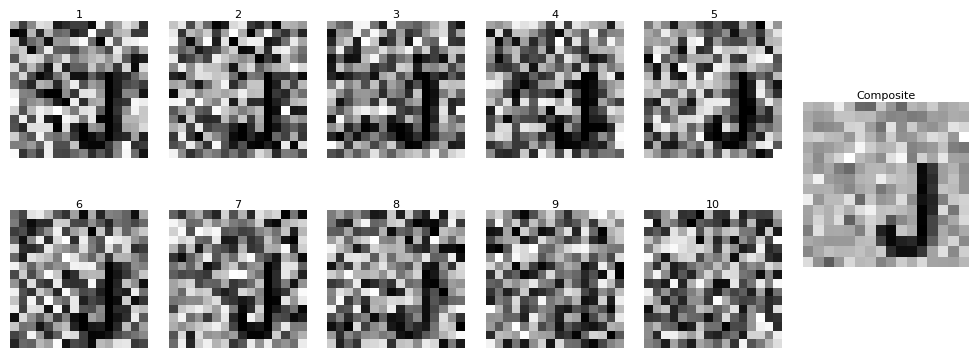

In [25]:
def create_compact_training_grid(valid_results, participant_id):
    # Extract training data
    selections = []
    for result in valid_results:
        if result['metadata']['participant_id'] == participant_id:
            if 'training_phase' in result and 'trials' in result['training_phase']:
                selections = [trial['selected_image'] for trial in result['training_phase']['trials'] 
                            if 'selected_image' in trial]
                break
    
    if selections:
        # Create a figure with a specific aspect ratio
        fig = plt.figure(figsize=(10, 4))
        
        # Calculate number of selections for grid layout
        n_selections = len(selections)
        n_per_row = n_selections // 2  # Split selections into 2 rows
        
        # Create grid: 2 rows for selections, last column for composite
        grid = plt.GridSpec(2, n_per_row + 1, width_ratios=[1]*n_per_row + [1.2])
        
        # Plot selections in first n_per_row columns
        for idx, img_base64 in enumerate(selections):
            row = idx // n_per_row
            col = idx % n_per_row
            ax = plt.subplot(grid[row, col])
            try:
                img = decode_base64_image(img_base64)
                ax.imshow(img.convert('L'), cmap='gray')
                ax.axis('off')
                ax.set_title(f'{idx+1}', fontsize=8, pad=2)
            except Exception as e:
                print(f"Error with image {idx}: {e}")
        
        # Create composite in last column, spanning both rows
        composite_ax = plt.subplot(grid[:, -1])
        selected_images = [decode_base64_image(img) for img in selections]
        if selected_images:
            composite = create_composite_image(selected_images)
            composite_ax.imshow(composite, cmap='gray')
            composite_ax.axis('off')
            composite_ax.set_title('Composite', fontsize=8, pad=2)
        
        plt.tight_layout(pad=1.5)
        plt.show()

# Run visualization
create_compact_training_grid(valid_results, '11929')

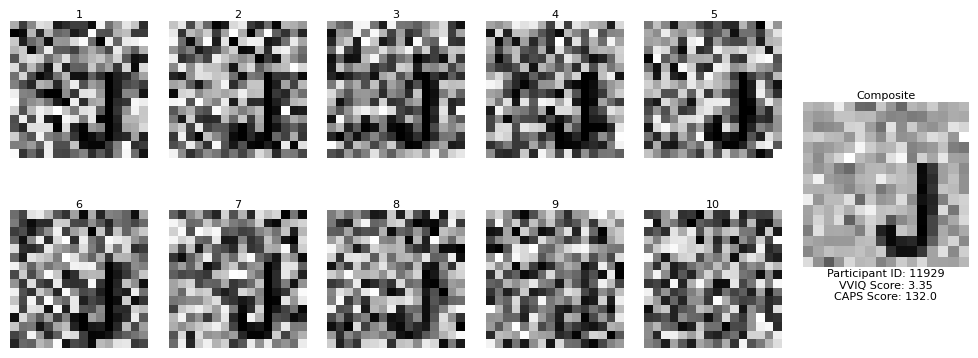

In [26]:
def create_compact_training_grid(valid_results, participant_id, vviq_summary, caps_summary):
    # Extract training data
    selections = []
    for result in valid_results:
        if result['metadata']['participant_id'] == participant_id:
            if 'training_phase' in result and 'trials' in result['training_phase']:
                selections = [trial['selected_image'] for trial in result['training_phase']['trials'] 
                            if 'selected_image' in trial]
                break
    
    if selections:
        # Get participant info
        vviq_score = vviq_summary.loc[participant_id, 'total_mean']
        caps_score = caps_summary.loc[participant_id, 'total_score']
        
        # Create a figure with a specific aspect ratio
        fig = plt.figure(figsize=(10, 4))
        
        # Calculate number of selections for grid layout
        n_selections = len(selections)
        n_per_row = n_selections // 2  # Split selections into 2 rows
        
        # Create grid: 2 rows for selections, last column for composite
        grid = plt.GridSpec(2, n_per_row + 1, width_ratios=[1]*n_per_row + [1.2])
        
        # Plot selections in first n_per_row columns
        for idx, img_base64 in enumerate(selections):
            row = idx // n_per_row
            col = idx % n_per_row
            ax = plt.subplot(grid[row, col])
            try:
                img = decode_base64_image(img_base64)
                ax.imshow(img.convert('L'), cmap='gray')
                ax.axis('off')
                ax.set_title(f'{idx+1}', fontsize=8, pad=2)
            except Exception as e:
                print(f"Error with image {idx}: {e}")
        
        # Create composite in last column, spanning both rows
        composite_ax = plt.subplot(grid[:, -1])
        selected_images = [decode_base64_image(img) for img in selections]
        if selected_images:
            composite = create_composite_image(selected_images)
            composite_ax.imshow(composite, cmap='gray')
            composite_ax.axis('off')
            composite_ax.set_title('Composite', fontsize=8, pad=2)
            
            # Add participant info below the composite
            info_text = f'Participant ID: {participant_id}\nVVIQ Score: {vviq_score:.2f}\nCAPS Score: {caps_score:.1f}'
            composite_ax.text(0.5, -0.2, info_text, 
                            fontsize=8, ha='center', 
                            transform=composite_ax.transAxes)
        
        plt.tight_layout(pad=1.5)
        plt.show()

# Run visualization
create_compact_training_grid(valid_results, '11929', vviq_summary, caps_summary)

save the participants in a neat and tidy way for easy classification for Guido

In [27]:
def save_all_classification_images(valid_results, clean_dfs, output_dir="classification_results"):
    """Save all classification images in both TIFF and CSV formats"""
    import os
    import numpy as np
    from PIL import Image
    
    # Create main output directory
    os.makedirs(output_dir, exist_ok=True)
    
    # Process clean participants' data
    clean_participant_data = process_evolution_data(valid_results, clean_dfs)
    
    for participant_id, participant_data in clean_participant_data.items():
        # Create participant directory
        participant_dir = os.path.join(output_dir, f"P{participant_id}")
        os.makedirs(participant_dir, exist_ok=True)
        
        # Process each session
        for session, session_data in participant_data.items():
            session_dir = os.path.join(participant_dir, f"S{session}")
            os.makedirs(session_dir, exist_ok=True)
            
            # Process each generation
            for gen, gen_data in session_data.items():
                gen_dir = os.path.join(session_dir, f"G{gen}")
                os.makedirs(gen_dir, exist_ok=True)
                
                # Save individual selections
                for idx, img_base64 in enumerate(gen_data['selected']):
                    try:
                        img = decode_base64_image(img_base64)
                        img_array = np.array(img.convert('L'))
                        
                        # Save as TIFF
                        tiff_filename = f"P{participant_id}_S{session}_G{gen}_sel{idx+1}.tiff"
                        Image.fromarray(img_array).save(
                            os.path.join(gen_dir, tiff_filename),
                            format='TIFF',
                            compression='tiff_lzw'
                        )
                        
                        # Save as CSV
                        csv_filename = f"P{participant_id}_S{session}_G{gen}_sel{idx+1}.csv"
                        np.savetxt(
                            os.path.join(gen_dir, csv_filename),
                            img_array,
                            delimiter=',',
                            fmt='%d'
                        )
                    except Exception as e:
                        print(f"Error saving image for P{participant_id} S{session} G{gen}: {str(e)}")
                
                # Create and save generation composite
                gen_images = []
                for img_base64 in gen_data['selected']:
                    try:
                        img = decode_base64_image(img_base64)
                        gen_images.append(img)
                    except:
                        continue
                
                if gen_images:
                    composite = create_composite_image(gen_images)
                    
                    # Save composite as TIFF
                    composite_tiff = f"P{participant_id}_S{session}_G{gen}_composite.tiff"
                    Image.fromarray(composite).save(
                        os.path.join(gen_dir, composite_tiff),
                        format='TIFF',
                        compression='tiff_lzw'
                    )
                    
                    # Save composite as CSV
                    composite_csv = f"P{participant_id}_S{session}_G{gen}_composite.csv"
                    np.savetxt(
                        os.path.join(gen_dir, composite_csv),
                        composite,
                        delimiter=',',
                        fmt='%d'
                    )
        
        # Create and save combined sessions composite
        combined_generations = {}
        for session, session_data in participant_data.items():
            for gen, gen_data in session_data.items():
                if gen not in combined_generations:
                    combined_generations[gen] = []
                combined_generations[gen].extend(gen_data['selected'])
        
        # Save combined composites
        for gen, gen_images_base64 in combined_generations.items():
            images = []
            for img_base64 in gen_images_base64:
                try:
                    img = decode_base64_image(img_base64)
                    images.append(img)
                except:
                    continue
            
            if images:
                composite = create_composite_image(images)
                
                # Save combined composite as TIFF
                tiff_filename = f"P{participant_id}_combined_G{gen}_composite.tiff"
                Image.fromarray(composite).save(
                    os.path.join(participant_dir, tiff_filename),
                    format='TIFF',
                    compression='tiff_lzw'
                )
                
                # Save combined composite as CSV
                csv_filename = f"P{participant_id}_combined_G{gen}_composite.csv"
                np.savetxt(
                    os.path.join(participant_dir, csv_filename),
                    composite,
                    delimiter=',',
                    fmt='%d'
                )

In [28]:
def export_study_data(valid_results, clean_dfs, output_dir="study_data_export"):
    """Export all study data in an OSF-ready format"""
    import os
    import shutil
    from datetime import datetime
    
    # Create main output directory with timestamp
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    output_dir = f"{output_dir}_{timestamp}"
    os.makedirs(output_dir, exist_ok=True)

    # 1. Save tabular data
    tabular_dir = os.path.join(output_dir, "tabular_data")
    os.makedirs(tabular_dir, exist_ok=True)
    
    # Save cleaned DataFrames
    for name, df in clean_dfs.items():
        df.to_csv(os.path.join(tabular_dir, f"{name}_data.csv"))
    
    # Save raw participant metadata
    participant_ids = clean_dfs['participants'].index.tolist()
    with open(os.path.join(tabular_dir, "participant_ids.txt"), 'w') as f:
        f.write("\n".join(map(str, participant_ids)))

    # 2. Save classification images
    image_dir = os.path.join(output_dir, "classification_images")
    save_all_classification_images(valid_results, clean_dfs, image_dir)

    # 3. Save analysis outputs
    analysis_dir = os.path.join(output_dir, "analysis_outputs")
    os.makedirs(analysis_dir, exist_ok=True)
    
    # Save correlation results
    correlation_df.to_csv(os.path.join(analysis_dir, "correlation_results.csv"))
    
    # Save questionnaire summaries
    vviq_summary.to_csv(os.path.join(analysis_dir, "vviq_summary.csv"))
    caps_summary.to_csv(os.path.join(analysis_dir, "caps_summary.csv"))
    visual_caps_summary.to_csv(os.path.join(analysis_dir, "visual_caps_summary.csv"))

    # 4. Create documentation
    readme_path = os.path.join(output_dir, "README.md")
    with open(readme_path, 'w') as f:
        f.write(f"""# Study Data Export ({timestamp})

## Directory Structure
- `tabular_data/`: Cleaned participant data in CSV format
  - `participants_data.csv`: Participant metadata and parameters
  - `training_data.csv`: Training phase performance metrics
  - `vviq_data.csv`: Visual Vividness Questionnaire responses
  - `caps_data.csv`: Creative Activities and Preferences Survey responses
  - `evolution_data.csv`: Evolutionary algorithm tracking
  
- `classification_images/`: Image data organized by participant
  - `P[ID]/`: Individual participant directories
    - `S[session]/`: Experimental sessions
      - `G[generation]/`: Evolutionary generations
        - TIFF and CSV versions of individual selections
        - Generation composite images

- `analysis_outputs/`: Precomputed analysis results
  - Correlation matrices and questionnaire summaries

## Data Dictionary
See accompanying `data_dictionary.md` for detailed column descriptions.
""")

    # Create zip archive for easy upload
    shutil.make_archive(output_dir, 'zip', output_dir)
    print(f"Export complete: {output_dir}.zip")

# Run the export function
export_study_data(valid_results, clean_dfs)

KeyboardInterrupt: 

In [60]:
correlation_df

,VVIQ_Eyes_Open,VVIQ_Eyes_Closed,VVIQ_Total,CAPS_Total,Visual_CAPS_Total
4737,3.176471,2.882353,3.029412,58,20
4739,2.176471,1.294118,1.735294,44,12
15169,1.235294,1.235294,1.235294,0,0
12109,2.352941,2.470588,2.411765,83,14
11974,2.911765,2.500000,2.705882,135,44
...,...,...,...,...,...
13666,1.941176,1.705882,1.823529,100,21
13246,2.705882,2.235294,2.470588,74,22
11983,2.058824,2.235294,2.147059,4,0
12475,2.470588,4.411765,3.441176,79,12
